In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import json

from imblearn.under_sampling import RandomUnderSampler

import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
from torchvision import transforms
import os
from torchvision.io import read_image
from torch.utils.data import Dataset, DataLoader

from sklearn.model_selection import train_test_split
from sklearn.metrics import ConfusionMatrixDisplay, classification_report, f1_score, accuracy_score

import prettytable

# 1 CNN классификация изображения (Опция 1)

In [ ]:
train_df = pd.read_csv('/kaggle/input/cassava-leaf-disease-classification/train.csv')
train_df

,image_id,label
0,1000015157.jpg,0
1,1000201771.jpg,3
2,100042118.jpg,1
3,1000723321.jpg,1
4,1000812911.jpg,3
...,...,...
21392,999068805.jpg,3
21393,999329392.jpg,3
21394,999474432.jpg,1
21395,999616605.jpg,4


In [ ]:
unique, counts = np.unique(train_df.label.values, return_counts=True)
unique, counts

(array([0, 1, 2, 3, 4]), array([ 1087,  2189,  2386, 13158,  2577]))

In [ ]:
labels = None

with open('/kaggle/input/cassava-leaf-disease-classification/label_num_to_disease_map.json') as f:
    labels = list(json.load(f).values())

labels

['Cassava Bacterial Blight (CBB)',
 'Cassava Brown Streak Disease (CBSD)',
 'Cassava Green Mottle (CGM)',
 'Cassava Mosaic Disease (CMD)',
 'Healthy']

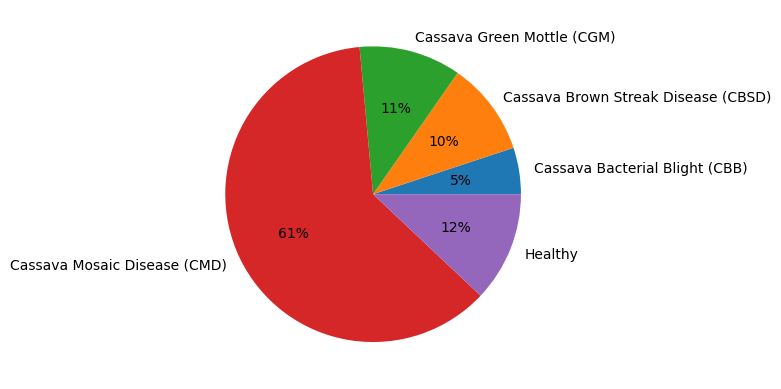

In [ ]:
plt.pie(counts, labels=labels, autopct='%.0f%%')
plt.show()

In [ ]:
X = train_df.image_id.values
y = train_df.label.values

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

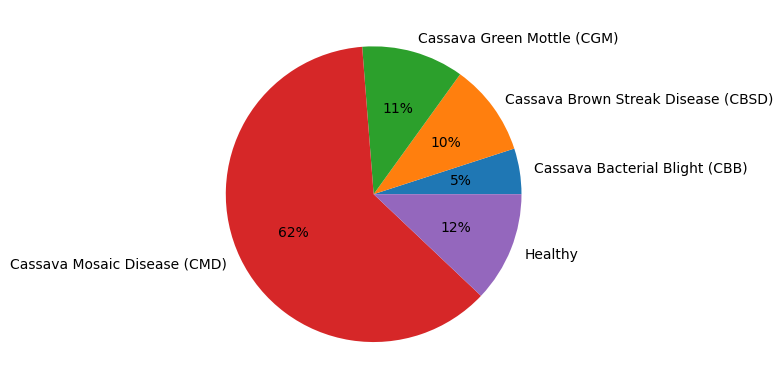

In [ ]:
plt.pie(np.unique(y_train, return_counts=True)[1], labels=labels, autopct='%.0f%%')
plt.show()

In [ ]:
rus = RandomUnderSampler(random_state=0)
X_resampled, y_resampled = rus.fit_resample(X_train.reshape(-1, 1), y_train)
X_resampled, X_val, y_resampled, y_val = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=1)

In [ ]:
X_train.shape, X_resampled.shape, X_val.shape

((17117,), (3420, 1), (855, 1))

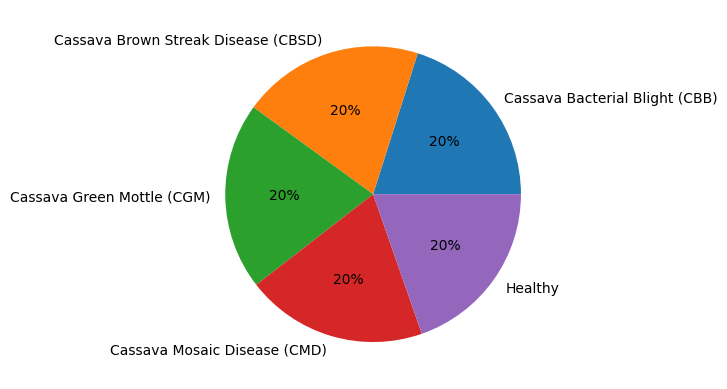

In [ ]:
unique, counts = np.unique(y_resampled, return_counts=True)

plt.pie(counts, labels=labels, autopct='%.0f%%')
plt.show()

In [ ]:
test_df = pd.DataFrame({'img': X_test.flatten(), 'label': y_test})
test_df.to_csv('test.csv', index=None)
test_df

,img,label
0,2875803913.jpg,4
1,1569193809.jpg,3
2,1829981265.jpg,2
3,125088495.jpg,3
4,826231979.jpg,1
...,...,...
4275,2567910282.jpg,1
4276,379034771.jpg,3
4277,792213146.jpg,3
4278,1681857148.jpg,3


In [ ]:
val_df = pd.DataFrame({'img': X_val.flatten(), 'label': y_val})
val_df.to_csv('val.csv', index=None)
val_df

,img,label
0,3305232077.jpg,1
1,1269646820.jpg,2
2,1510579448.jpg,0
3,3014758416.jpg,3
4,2522350885.jpg,0
...,...,...
850,797589607.jpg,4
851,1765190680.jpg,1
852,383932080.jpg,1
853,2498535927.jpg,3


In [ ]:
df = pd.DataFrame({'img': X_resampled.flatten(), 'label': y_resampled})
df.to_csv('train_sampled.csv', index=None)
df

,img,label
0,143092286.jpg,4
1,3349716864.jpg,2
2,1822627582.jpg,2
3,3384095978.jpg,0
4,212585211.jpg,4
...,...,...
3415,3304054356.jpg,3
3416,3515249327.jpg,3
3417,3391958379.jpg,1
3418,2762258439.jpg,4


In [ ]:
class CustomImageDataset(Dataset):
    def __init__(self, annotations_file, img_dir, transform=None, target_transform=None):
        self.img_labels = pd.read_csv(annotations_file)
        self.img_dir = img_dir
        self.transform = transform
        self.target_transform = target_transform

    def __len__(self):
        return len(self.img_labels)

    def __getitem__(self, idx):
        img_path = os.path.join(self.img_dir, self.img_labels.iloc[idx, 0])
        image = read_image(img_path)
        label = self.img_labels.iloc[idx, 1]
        if self.transform:
            image = self.transform(image)
        if self.target_transform:
            label = self.target_transform(label)
        return image, label

In [ ]:
transform = transforms.Compose([
    transforms.Resize((120, 160), antialias=True),
])

In [ ]:
ds = CustomImageDataset('/kaggle/working/train_sampled.csv', '/kaggle/input/cassava-leaf-disease-classification/train_images', transform=transform)

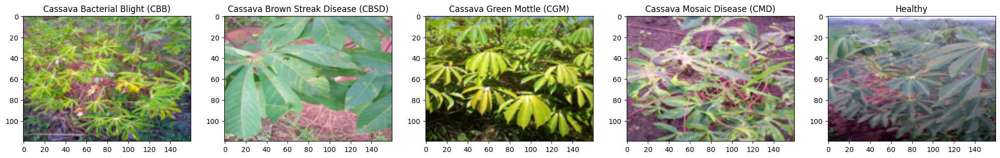

In [ ]:
fig, ax = plt.subplots(1, 5, figsize=(25, 10))

for l in df.label.unique():
    rec = df.loc[df.label == l].iloc[0]
    img, _ = ds[rec.name]

    ax[l].imshow(np.moveaxis(img.numpy(), 0, -1))
    ax[l].set_title(labels[l])

plt.show()

In [ ]:
train_dataloader = DataLoader(ds, batch_size=32, shuffle=True)

In [ ]:
val_ds = CustomImageDataset('/kaggle/working/val.csv', '/kaggle/input/cassava-leaf-disease-classification/train_images', transform=transform)
val_dataloader = DataLoader(val_ds, batch_size=32, shuffle=True)

In [ ]:
test_ds = CustomImageDataset('/kaggle/working/test.csv', '/kaggle/input/cassava-leaf-disease-classification/train_images', transform=transform)
test_dataloader = DataLoader(test_ds, batch_size=32, shuffle=True)

In [ ]:
%%time

next(iter(train_dataloader))

CPU times: user 538 ms, sys: 3.08 ms, total: 541 ms
Wall time: 335 ms


[tensor([[[[ 66,  69,  66,  ...,  27,  29,  48],
           [ 95, 103, 108,  ...,  54,  71,  91],
           [147, 152, 162,  ..., 173, 183, 171],
           ...,
           [ 11,   7,   6,  ...,  10,   5,  11],
           [ 13,   8,   9,  ...,   4,   3,  10],
           [ 14,   6,   4,  ...,  28,  19,  26]],
 
          [[ 97, 104, 104,  ...,  54,  51,  66],
           [124, 133, 138,  ...,  66,  77,  90],
           [167, 171, 179,  ..., 160, 170, 158],
           ...,
           [ 55,  58,  55,  ...,   1,   2,  13],
           [ 56,  55,  53,  ...,   3,   2,  11],
           [ 57,  53,  46,  ...,  45,  29,  28]],
 
          [[ 88,  90,  92,  ...,  17,   9,  11],
           [131, 135, 143,  ...,  29,  30,  34],
           [181, 169, 171,  ..., 106, 104,  88],
           ...,
           [  4,   5,   4,  ...,   2,   3,   7],
           [  5,   6,   7,  ...,   3,   3,   6],
           [  4,   3,   2,  ...,  15,   8,  11]]],
 
 
         [[[ 10,  20,  13,  ..., 142, 148, 110],
         

In [ ]:
nn.Sequential(
    nn.Conv2d(3, 16, 3),
    nn.ReLU(),
    nn.Conv2d(16, 32, 3),
    nn.ReLU(),
    nn.MaxPool2d(5, 2),
    nn.Conv2d(32, 48, 3),
    nn.ReLU(),
    nn.Conv2d(48, 64, 3),
    nn.ReLU(),
    nn.MaxPool2d(5, 2),
    nn.Conv2d(64, 96, 3),
    nn.ReLU(),
    nn.Conv2d(96, 128, 3),
    nn.ReLU(),
    nn.MaxPool2d(5, 2),
)(ds[0][0].to(torch.float32)).shape

torch.Size([128, 8, 13])

In [ ]:
128*8*13

13312

In [ ]:
from typing import Callable

def tester(inferFunc: Callable, test_loader: DataLoader, device: str = 'cpu') -> None:
    out = display(IPython.display.Pretty('Starting testing...'), display_id=True)
    steps = 0
    y_pred = torch.Tensor().to(device)
    y_true = torch.Tensor()
    for x, y in test_loader:
        x = x.to(torch.double).to(device)
        pred = inferFunc(x)
        y_pred = torch.cat([y_pred, pred], dim=0)
        y_true = torch.cat([y_true, y], dim=0)
        steps += 1
        out.update(IPython.display.Pretty(f'    Done {steps}/{len(test_loader)} [size {test_loader.batch_size}]'))

    print(classification_report(y_true.numpy(), y_pred.to('cpu').numpy()))
    ConfusionMatrixDisplay.from_predictions(y_true.numpy(), y_pred.to('cpu').numpy())

In [ ]:
class Flatten(nn.Module):
    def __init__(self):
        super(Flatten, self).__init__()

    def forward(self, x):
        return torch.flatten(x, 1)

## CNN + SGD

In [ ]:
class CNN(nn.Module):
    def __init__(self):
        super(CNN, self).__init__()

        self.classifier = nn.Sequential(
            nn.Conv2d(3, 16, 3),
            nn.ReLU(),
            nn.Conv2d(16, 32, 3),
            nn.ReLU(),
            nn.MaxPool2d(5, 2),
            nn.Conv2d(32, 48, 3),
            nn.ReLU(),
            nn.Conv2d(48, 64, 3),
            nn.ReLU(),
            nn.MaxPool2d(5, 2),
            nn.Conv2d(64, 96, 3),
            nn.ReLU(),
            nn.Conv2d(96, 128, 3),
            nn.ReLU(),
            nn.MaxPool2d(5, 2),
            Flatten(),
            nn.Linear(13312, 1024),
            nn.ReLU(),
            nn.Linear(1024, 512),
            nn.ReLU(),
            nn.Linear(512, 128),
            nn.Linear(128, 64),
            nn.ReLU(),
            nn.Linear(64, 5)
        )

        self.double()

    def forward(self, x):
        return self.classifier(x)

    def infer(self, x):
        p = None
        with torch.no_grad():
            p = self.classifier(x).argmax(dim=1)

        return p

In [ ]:
torch.cuda.empty_cache()

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

model = CNN()

if torch.cuda.device_count() > 1:
    print("Let's use", torch.cuda.device_count(), "GPUs!")
    model = nn.DataParallel(model)

model.to(device)

Let's use 2 GPUs!


DataParallel(
  (module): CNN(
    (classifier): Sequential(
      (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1))
      (1): ReLU()
      (2): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1))
      (3): ReLU()
      (4): MaxPool2d(kernel_size=5, stride=2, padding=0, dilation=1, ceil_mode=False)
      (5): Conv2d(32, 48, kernel_size=(3, 3), stride=(1, 1))
      (6): ReLU()
      (7): Conv2d(48, 64, kernel_size=(3, 3), stride=(1, 1))
      (8): ReLU()
      (9): MaxPool2d(kernel_size=5, stride=2, padding=0, dilation=1, ceil_mode=False)
      (10): Conv2d(64, 96, kernel_size=(3, 3), stride=(1, 1))
      (11): ReLU()
      (12): Conv2d(96, 128, kernel_size=(3, 3), stride=(1, 1))
      (13): ReLU()
      (14): MaxPool2d(kernel_size=5, stride=2, padding=0, dilation=1, ceil_mode=False)
      (15): Flatten()
      (16): Linear(in_features=13312, out_features=1024, bias=True)
      (17): ReLU()
      (18): Linear(in_features=1024, out_features=512, bias=True)
      (19): ReLU()
      (2

In [ ]:
optimizer = torch.optim.SGD(model.parameters(), lr=0.003)
criterion = nn.CrossEntropyLoss()

In [ ]:
import IPython
from math import ceil

bs = 32

total_b = ceil(len(ds) / bs)
total_val_b = ceil(len(val_ds) / bs)

best_loss = float('inf')

loss_history = []
accuracy_history = []
f1_history = []

n_epoch = 10

model.train()

for epoch in range(n_epoch):
    total_loss = 0
    steps = 0
    print(f'\nEpoch {epoch+1} of {n_epoch}')
    out = display(IPython.display.Pretty('Starting...'), display_id=True)
    for x, y in train_dataloader:
        optimizer.zero_grad()
        x = x.to(torch.double).to(device)
        y = y.to(device)
        output = model(x)

        loss = criterion(output, y)

        loss.backward()
        optimizer.step()

        x = x.to('cpu')
        y = y.to('cpu')

        del x
        del y

        total_loss += loss.item()
        steps += 1
        out.update(IPython.display.Pretty(f'  Done {steps}/{total_b} [size {bs}]\tLoss: {total_loss}'))

    print(f'  Loss per batch: {total_loss/total_b}')
    print('\n  Validation')
    out1 = display(IPython.display.Pretty('Starting validation...'), display_id=True)
    steps = 0
    y_pred = torch.Tensor().to(device)
    y_true = torch.Tensor()
    for x, y in val_dataloader:
        x = x.to(torch.double).to(device)
        pred = model.module.infer(x)
        y_pred = torch.cat([y_pred, pred], dim=0)
        y_true = torch.cat([y_true, y], dim=0)
        steps += 1
        out1.update(IPython.display.Pretty(f'    Done {steps}/{total_val_b} [size {bs}]'))

    acs = accuracy_score(y_true.numpy(), y_pred.to("cpu").numpy())
    f1s = f1_score(y_true.numpy(), y_pred.to("cpu").numpy(), average="macro")

    accuracy_history.append(acs)
    f1_history.append(f1s)

    print(f'    Accuracy: {acs}')
    print(f'    F1 (macro): {f1s}')

    if (total_loss < best_loss):
        torch.save(model.state_dict(), f'cnn_sgd_e{epoch+1}.pt')
        best_loss = total_loss


Epoch 1 of 10


  Done 107/107 [size 32]	Loss: 171.9186791553645

  Loss per batch: 1.606716627620229

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.18011695906432748
    F1 (macro): 0.0672254600018664

Epoch 2 of 10


  Done 107/107 [size 32]	Loss: 171.768468301827

  Loss per batch: 1.605312787867542

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.25380116959064325
    F1 (macro): 0.17648718605087435

Epoch 3 of 10


  Done 107/107 [size 32]	Loss: 171.49457858274684

  Loss per batch: 1.602753070866793

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.24912280701754386
    F1 (macro): 0.1695801199917985

Epoch 4 of 10


  Done 107/107 [size 32]	Loss: 170.92333183386904

  Loss per batch: 1.5974143162043837

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.27017543859649124
    F1 (macro): 0.20537524193794

Epoch 5 of 10


  Done 107/107 [size 32]	Loss: 168.97519848166453

  Loss per batch: 1.5792074624454628

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.26666666666666666
    F1 (macro): 0.16104698700602826

Epoch 6 of 10


  Done 107/107 [size 32]	Loss: 165.87059162021853

  Loss per batch: 1.5501924450487714

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.2912280701754386
    F1 (macro): 0.2372915709646614

Epoch 7 of 10


  Done 107/107 [size 32]	Loss: 163.07226419744546

  Loss per batch: 1.5240398523125744

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.3192982456140351
    F1 (macro): 0.2894672590831775

Epoch 8 of 10


  Done 107/107 [size 32]	Loss: 161.8298187913236

  Loss per batch: 1.5124282130030242

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.3286549707602339
    F1 (macro): 0.28096924398923917

Epoch 9 of 10


  Done 107/107 [size 32]	Loss: 160.12069997223404

  Loss per batch: 1.4964551399274209

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.3321637426900585
    F1 (macro): 0.29519871255839253

Epoch 10 of 10


  Done 107/107 [size 32]	Loss: 158.45919939019848

  Loss per batch: 1.4809270971046586

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.34619883040935673
    F1 (macro): 0.3127725367625711


In [ ]:
import IPython
from math import ceil

bs = 32

total_b = ceil(len(ds) / bs)
total_val_b = ceil(len(val_ds) / bs)

n_epoch = 25

model.train()

for epoch in range(10, n_epoch):
    total_loss = 0
    steps = 0
    print(f'\nEpoch {epoch+1} of {n_epoch}')
    out = display(IPython.display.Pretty('Starting...'), display_id=True)
    for x, y in train_dataloader:
        optimizer.zero_grad()
        x = x.to(torch.double).to(device)
        y = y.to(device)
        output = model(x)

        loss = criterion(output, y)

        loss.backward()
        optimizer.step()

        x = x.to('cpu')
        y = y.to('cpu')

        del x
        del y

        total_loss += loss.item()
        steps += 1
        out.update(IPython.display.Pretty(f'  Done {steps}/{total_b} [size {bs}]\tLoss: {total_loss}'))

    print(f'  Loss per batch: {total_loss/total_b}')
    print('\n  Validation')
    out1 = display(IPython.display.Pretty('Starting validation...'), display_id=True)
    steps = 0
    y_pred = torch.Tensor().to(device)
    y_true = torch.Tensor()
    for x, y in val_dataloader:
        x = x.to(torch.double).to(device)
        pred = model.module.infer(x)
        y_pred = torch.cat([y_pred, pred], dim=0)
        y_true = torch.cat([y_true, y], dim=0)
        steps += 1
        out1.update(IPython.display.Pretty(f'    Done {steps}/{total_val_b} [size {bs}]'))

    acs = accuracy_score(y_true.numpy(), y_pred.to("cpu").numpy())
    f1s = f1_score(y_true.numpy(), y_pred.to("cpu").numpy(), average="macro")

    accuracy_history.append(acs)
    f1_history.append(f1s)

    print(f'    Accuracy: {acs}')
    print(f'    F1 (macro): {f1s}')

    if (total_loss < best_loss):
        torch.save(model.state_dict(), f'cnn_sgd_e{epoch+1}.pt')
        best_loss = total_loss


Epoch 11 of 25


  Done 107/107 [size 32]	Loss: 157.9559200622926

  Loss per batch: 1.476223551984043

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.36608187134502923
    F1 (macro): 0.3611491930780806

Epoch 12 of 25


  Done 107/107 [size 32]	Loss: 156.6433890705899

  Loss per batch: 1.4639569072017748

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.3216374269005848
    F1 (macro): 0.2564182748948275

Epoch 13 of 25


  Done 107/107 [size 32]	Loss: 154.6762214064291

  Loss per batch: 1.4455721626769076

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.3169590643274854
    F1 (macro): 0.25744489345439153

Epoch 14 of 25


  Done 107/107 [size 32]	Loss: 155.65653256212246

  Loss per batch: 1.4547339491787146

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.36023391812865496
    F1 (macro): 0.32479629991849407

Epoch 15 of 25


  Done 107/107 [size 32]	Loss: 153.19463900826932

  Loss per batch: 1.4317255982081245

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.3333333333333333
    F1 (macro): 0.27863049947085744

Epoch 16 of 25


  Done 107/107 [size 32]	Loss: 152.7072957334161

  Loss per batch: 1.4271709881627672

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.3824561403508772
    F1 (macro): 0.37454594154048054

Epoch 17 of 25


  Done 107/107 [size 32]	Loss: 152.35752434365756

  Loss per batch: 1.423902096669697

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.391812865497076
    F1 (macro): 0.38982494913401056

Epoch 18 of 25


  Done 107/107 [size 32]	Loss: 150.61922344842927

  Loss per batch: 1.407656293910554

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.38596491228070173
    F1 (macro): 0.36850292792368083

Epoch 19 of 25


  Done 107/107 [size 32]	Loss: 150.13049917766756

  Loss per batch: 1.4030887773613792

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.26900584795321636
    F1 (macro): 0.19131139373487868

Epoch 20 of 25


  Done 107/107 [size 32]	Loss: 149.18886095984027

  Loss per batch: 1.394288420185423

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.38128654970760234
    F1 (macro): 0.3611825066720515

Epoch 21 of 25


  Done 107/107 [size 32]	Loss: 147.69384366018355

  Loss per batch: 1.3803162958895658

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.37777777777777777
    F1 (macro): 0.36210959601608994

Epoch 22 of 25


  Done 107/107 [size 32]	Loss: 147.76858888519757

  Loss per batch: 1.38101484939437

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.3730994152046784
    F1 (macro): 0.37451573834523866

Epoch 23 of 25


  Done 107/107 [size 32]	Loss: 146.11221769216027

  Loss per batch: 1.3655347447865447

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.39766081871345027
    F1 (macro): 0.38590858218198476

Epoch 24 of 25


  Done 107/107 [size 32]	Loss: 145.08829664006348

  Loss per batch: 1.3559653891594718

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.3695906432748538
    F1 (macro): 0.3513851500243594

Epoch 25 of 25


  Done 107/107 [size 32]	Loss: 143.99443235226315

  Loss per batch: 1.3457423584323658

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.3695906432748538
    F1 (macro): 0.3453679177379812


    Done 134/134 [size 32]

              precision    recall  f1-score   support

         0.0       0.44      0.36      0.40       232
         1.0       0.36      0.32      0.34       467
         2.0       0.20      0.33      0.25       472
         3.0       0.75      0.77      0.76      2597
         4.0       0.32      0.12      0.18       512

    accuracy                           0.57      4280
   macro avg       0.41      0.38      0.38      4280
weighted avg       0.58      0.57      0.57      4280



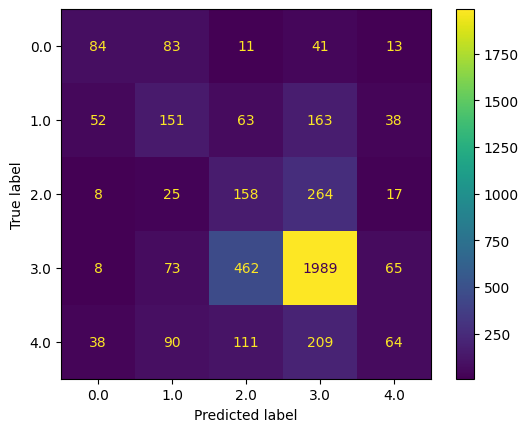

In [ ]:
tester(model.module.infer, test_dataloader, device)

In [ ]:
torch.save(model.state_dict(), 'cnn_sgd.pt')

## CNN + Adam

In [ ]:
class CNN(nn.Module):
    def __init__(self, init_weights: bool = True):
        super(CNN, self).__init__()

        self.classifier = nn.Sequential(
            nn.Conv2d(3, 16, 3),
            nn.ReLU(),
            nn.Conv2d(16, 32, 3),
            nn.ReLU(),
            nn.MaxPool2d(5, 2),
            nn.Conv2d(32, 48, 3),
            nn.ReLU(),
            nn.Conv2d(48, 64, 3),
            nn.ReLU(),
            nn.MaxPool2d(5, 2),
            nn.Conv2d(64, 96, 3),
            nn.ReLU(),
            nn.Conv2d(96, 128, 3),
            nn.ReLU(),
            nn.MaxPool2d(5, 2),
            Flatten(),
            nn.Linear(13312, 1024),
            nn.ReLU(),
            nn.Linear(1024, 512),
            nn.ReLU(),
            nn.Linear(512, 128),
            nn.Linear(128, 64),
            nn.ReLU(),
            nn.Linear(64, 5)
        )

        self.double()

        if init_weights:
            self.classifier.apply(self.init_weights)

    def init_weights(self, m):
        if isinstance(m, (nn.Linear, nn.Conv2d)):
            nn.init.kaiming_normal_(m.weight, mode='fan_in', nonlinearity='relu')
            nn.init.zeros_(m.bias)

    def forward(self, x):
        return self.classifier(x)

    def infer(self, x):
        p = None
        with torch.no_grad():
            p = self.classifier(x).argmax(dim=1)

        return p

In [ ]:
torch.cuda.empty_cache()

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

model = CNN()

if torch.cuda.device_count() > 1:
    print("Let's use", torch.cuda.device_count(), "GPUs!")
    model = nn.DataParallel(model)

model.to(device)

Let's use 2 GPUs!


DataParallel(
  (module): CNN(
    (classifier): Sequential(
      (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1))
      (1): ReLU()
      (2): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1))
      (3): ReLU()
      (4): MaxPool2d(kernel_size=5, stride=2, padding=0, dilation=1, ceil_mode=False)
      (5): Conv2d(32, 48, kernel_size=(3, 3), stride=(1, 1))
      (6): ReLU()
      (7): Conv2d(48, 64, kernel_size=(3, 3), stride=(1, 1))
      (8): ReLU()
      (9): MaxPool2d(kernel_size=5, stride=2, padding=0, dilation=1, ceil_mode=False)
      (10): Conv2d(64, 96, kernel_size=(3, 3), stride=(1, 1))
      (11): ReLU()
      (12): Conv2d(96, 128, kernel_size=(3, 3), stride=(1, 1))
      (13): ReLU()
      (14): MaxPool2d(kernel_size=5, stride=2, padding=0, dilation=1, ceil_mode=False)
      (15): Flatten()
      (16): Linear(in_features=13312, out_features=1024, bias=True)
      (17): ReLU()
      (18): Linear(in_features=1024, out_features=512, bias=True)
      (19): ReLU()
      (2

In [ ]:
optimizer = torch.optim.Adam(model.parameters(), lr=0.0001)
criterion = nn.CrossEntropyLoss()

In [ ]:
import IPython
from math import ceil

bs = 32

total_b = ceil(len(ds) / bs)
total_val_b = ceil(len(val_ds) / bs)

n_epoch = 25

best_loss = float('inf')

loss_history = []
accuracy_history = []
f1_history = []

model.train()

for epoch in range(n_epoch):
    total_loss = 0
    steps = 0
    print(f'\nEpoch {epoch+1} of {n_epoch}')
    out = display(IPython.display.Pretty('Starting...'), display_id=True)
    for x, y in train_dataloader:
        optimizer.zero_grad()
        x = x.to(torch.double).to(device)
        y = y.to(device)
        output = model(x)

        loss = criterion(output, y)

        loss.backward()
        optimizer.step()

        x = x.to('cpu')
        y = y.to('cpu')

        del x
        del y

        total_loss += loss.item()
        steps += 1
        out.update(IPython.display.Pretty(f'  Done {steps}/{total_b} [size {bs}]\tLoss: {total_loss}'))

    print(f'  Loss per batch: {total_loss/total_b}')
    loss_history.append(total_loss/total_b)
    print('\n  Validation')
    out1 = display(IPython.display.Pretty('Starting validation...'), display_id=True)
    steps = 0
    y_pred = torch.Tensor().to(device)
    y_true = torch.Tensor()
    for x, y in val_dataloader:
        x = x.to(torch.double).to(device)
        pred = model.module.infer(x)
        y_pred = torch.cat([y_pred, pred], dim=0)
        y_true = torch.cat([y_true, y], dim=0)
        steps += 1
        out1.update(IPython.display.Pretty(f'    Done {steps}/{total_val_b} [size {bs}]'))

    acs = accuracy_score(y_true.numpy(), y_pred.to("cpu").numpy())
    f1s = f1_score(y_true.numpy(), y_pred.to("cpu").numpy(), average="macro")

    accuracy_history.append(acs)
    f1_history.append(f1s)

    print(f'    Accuracy: {acs}')
    print(f'    F1 (macro): {f1s}')

    if (total_loss < best_loss):
        torch.save(model.state_dict(), f'cnn_adam_e{epoch+1}.pt')
        best_loss = total_loss


Epoch 1 of 25


  Done 107/107 [size 32]	Loss: 9679.05524936913

  Loss per batch: 90.45846027447786

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.2631578947368421
    F1 (macro): 0.22295760762820077

Epoch 2 of 25


  Done 107/107 [size 32]	Loss: 978.9843439603695

  Loss per batch: 9.149386392152985

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.27017543859649124
    F1 (macro): 0.2443696730499482

Epoch 3 of 25


  Done 107/107 [size 32]	Loss: 609.8464568701023

  Loss per batch: 5.699499596916844

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.2935672514619883
    F1 (macro): 0.22085900506896378

Epoch 4 of 25


  Done 107/107 [size 32]	Loss: 463.5823653318425

  Loss per batch: 4.332545470391051

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.29239766081871343
    F1 (macro): 0.2764911069432953

Epoch 5 of 25


  Done 107/107 [size 32]	Loss: 286.91762529171996

  Loss per batch: 2.681473133567476

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.29005847953216374
    F1 (macro): 0.2897901765787469

Epoch 6 of 25


  Done 107/107 [size 32]	Loss: 195.28903514392607

  Loss per batch: 1.8251311695694026

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.3216374269005848
    F1 (macro): 0.3184323734719392

Epoch 7 of 25


  Done 107/107 [size 32]	Loss: 140.25898025101125

  Loss per batch: 1.3108315911309463

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.295906432748538
    F1 (macro): 0.2887964966542692

Epoch 8 of 25


  Done 107/107 [size 32]	Loss: 99.8703965318288

  Loss per batch: 0.9333681918862505

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.32397660818713453
    F1 (macro): 0.30188088319811535

Epoch 9 of 25


  Done 107/107 [size 32]	Loss: 73.91660776315065

  Loss per batch: 0.6908094183472023

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.29473684210526313
    F1 (macro): 0.27931368000296564

Epoch 10 of 25


  Done 107/107 [size 32]	Loss: 45.635923585103086

  Loss per batch: 0.42650395873928115

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.28538011695906434
    F1 (macro): 0.28478088841865146

Epoch 11 of 25


  Done 107/107 [size 32]	Loss: 35.06067724648226

  Loss per batch: 0.3276698808082454

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.2970760233918129
    F1 (macro): 0.2953662694616944

Epoch 12 of 25


  Done 107/107 [size 32]	Loss: 19.828533762493233

  Loss per batch: 0.18531339964946947

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.3017543859649123
    F1 (macro): 0.29875080439139756

Epoch 13 of 25


  Done 107/107 [size 32]	Loss: 10.005978396832338

  Loss per batch: 0.0935138167928256

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.3169590643274854
    F1 (macro): 0.3184491851145302

Epoch 14 of 25


  Done 107/107 [size 32]	Loss: 6.523634808372859

  Loss per batch: 0.0609685496109613

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.32748538011695905
    F1 (macro): 0.32671895694145225

Epoch 15 of 25


  Done 107/107 [size 32]	Loss: 3.575241859765018

  Loss per batch: 0.03341347532490671

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.312280701754386
    F1 (macro): 0.3129443235160328

Epoch 16 of 25


  Done 107/107 [size 32]	Loss: 2.2831787522674847

  Loss per batch: 0.02133811918006995

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.3111111111111111
    F1 (macro): 0.31053608372520053

Epoch 17 of 25


  Done 107/107 [size 32]	Loss: 1.5214983803669464

  Loss per batch: 0.01421961103146679

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.3157894736842105
    F1 (macro): 0.3157862386842024

Epoch 18 of 25


  Done 107/107 [size 32]	Loss: 1.1189846438401985

  Loss per batch: 0.01045780040972148

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.3134502923976608
    F1 (macro): 0.3138513637240556

Epoch 19 of 25


  Done 107/107 [size 32]	Loss: 0.8849819404715064

  Loss per batch: 0.00827085925674305

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.30994152046783624
    F1 (macro): 0.31011908671429617

Epoch 20 of 25


  Done 107/107 [size 32]	Loss: 0.7212741444694393

  Loss per batch: 0.0067408798548545725

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.3146198830409357
    F1 (macro): 0.3149240797364611

Epoch 21 of 25


  Done 107/107 [size 32]	Loss: 0.6170267245501598

  Loss per batch: 0.005766604902337942

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.3134502923976608
    F1 (macro): 0.31323296532555184

Epoch 22 of 25


  Done 107/107 [size 32]	Loss: 0.5306848212926479

  Loss per batch: 0.004959671227034093

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.30760233918128654
    F1 (macro): 0.3072232586043201

Epoch 23 of 25


  Done 107/107 [size 32]	Loss: 0.4438971081423765

  Loss per batch: 0.004148571104134359

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.3134502923976608
    F1 (macro): 0.3137165945469554

Epoch 24 of 25


  Done 107/107 [size 32]	Loss: 0.3889874126624234

  Loss per batch: 0.0036353963800226487

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.30526315789473685
    F1 (macro): 0.3048644916408633

Epoch 25 of 25


  Done 107/107 [size 32]	Loss: 0.3358860666123373

  Loss per batch: 0.003139122117872311

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.30994152046783624
    F1 (macro): 0.3101871091372935


Text(0.5, 0, 'Номер эпохи')

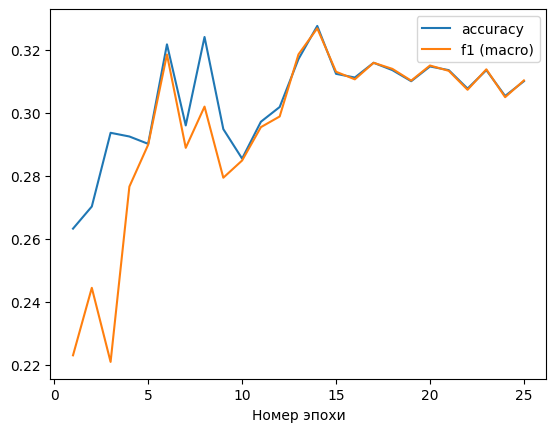

In [ ]:
plt.plot(range(1, 26), accuracy_history, label='accuracy')
plt.plot(range(1, 26), f1_history, label='f1 (macro)')

plt.legend()
plt.xlabel('Номер эпохи')

Text(0.5, 0, 'Номер эпохи')

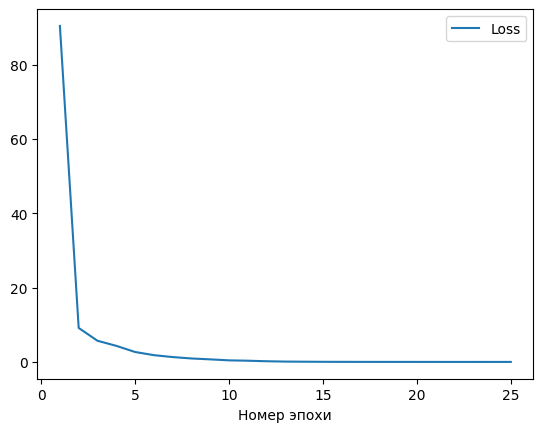

In [ ]:
plt.plot(range(1, 26), loss_history, label='Loss')

plt.legend()

plt.xlabel('Номер эпохи')

    Done 134/134 [size 32]

              precision    recall  f1-score   support

         0.0       0.18      0.45      0.25       232
         1.0       0.23      0.31      0.26       467
         2.0       0.15      0.31      0.20       472
         3.0       0.80      0.40      0.53      2597
         4.0       0.18      0.27      0.21       512

    accuracy                           0.36      4280
   macro avg       0.31      0.35      0.29      4280
weighted avg       0.56      0.36      0.41      4280



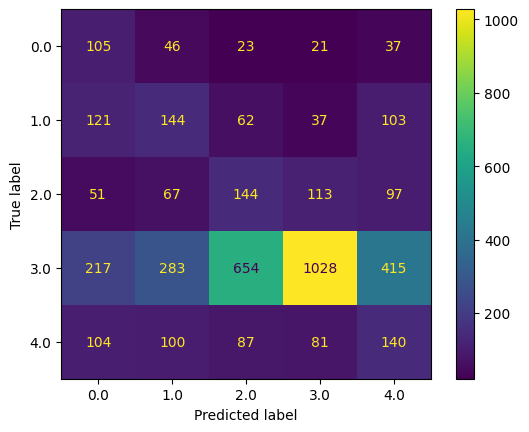

In [ ]:
tester(model.module.infer, test_dataloader, device)

## CNN + Adam + CyclicLR scheduler

In [ ]:
class CNN(nn.Module):
    def __init__(self, init_weights: bool = True):
        super(CNN, self).__init__()

        self.classifier = nn.Sequential(
            nn.Conv2d(3, 16, 3),
            nn.ReLU(),
            nn.Conv2d(16, 32, 3),
            nn.ReLU(),
            nn.MaxPool2d(5, 2),
            nn.Conv2d(32, 48, 3),
            nn.ReLU(),
            nn.Conv2d(48, 64, 3),
            nn.ReLU(),
            nn.MaxPool2d(5, 2),
            nn.Conv2d(64, 96, 3),
            nn.ReLU(),
            nn.Conv2d(96, 128, 3),
            nn.ReLU(),
            nn.MaxPool2d(5, 2),
            Flatten(),
            nn.Linear(13312, 1024),
            nn.ReLU(),
            nn.Linear(1024, 512),
            nn.ReLU(),
            nn.Linear(512, 128),
            nn.Linear(128, 64),
            nn.ReLU(),
            nn.Linear(64, 5)
        )

        self.double()

        if init_weights:
            self.classifier.apply(self.init_weights)

    def init_weights(self, m):
        if isinstance(m, (nn.Linear, nn.Conv2d)):
            nn.init.kaiming_normal_(m.weight, mode='fan_in', nonlinearity='relu')
            nn.init.zeros_(m.bias)

    def forward(self, x):
        return self.classifier(x)

    def infer(self, x):
        p = None
        with torch.no_grad():
            p = self.classifier(x).argmax(dim=1)

        return p

In [ ]:
torch.cuda.empty_cache()

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

model = CNN()

if torch.cuda.device_count() > 1:
    print("Let's use", torch.cuda.device_count(), "GPUs!")
    model = nn.DataParallel(model)

model.to(device)

Let's use 2 GPUs!


DataParallel(
  (module): CNN(
    (classifier): Sequential(
      (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1))
      (1): ReLU()
      (2): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1))
      (3): ReLU()
      (4): MaxPool2d(kernel_size=5, stride=2, padding=0, dilation=1, ceil_mode=False)
      (5): Conv2d(32, 48, kernel_size=(3, 3), stride=(1, 1))
      (6): ReLU()
      (7): Conv2d(48, 64, kernel_size=(3, 3), stride=(1, 1))
      (8): ReLU()
      (9): MaxPool2d(kernel_size=5, stride=2, padding=0, dilation=1, ceil_mode=False)
      (10): Conv2d(64, 96, kernel_size=(3, 3), stride=(1, 1))
      (11): ReLU()
      (12): Conv2d(96, 128, kernel_size=(3, 3), stride=(1, 1))
      (13): ReLU()
      (14): MaxPool2d(kernel_size=5, stride=2, padding=0, dilation=1, ceil_mode=False)
      (15): Flatten()
      (16): Linear(in_features=13312, out_features=1024, bias=True)
      (17): ReLU()
      (18): Linear(in_features=1024, out_features=512, bias=True)
      (19): ReLU()
      (2

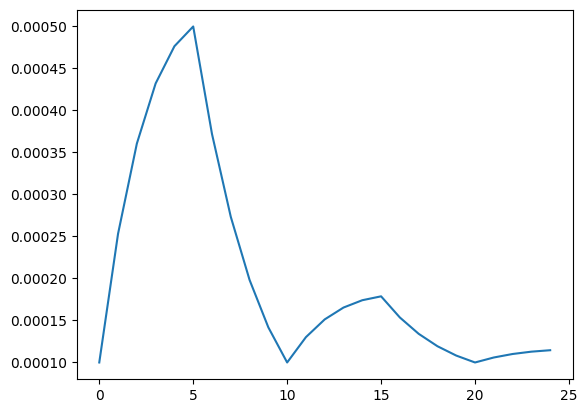

In [ ]:
model_sc = torch.nn.Linear(2, 1)
optimizer = torch.optim.Adam(model_sc.parameters(), lr=0.0001)
scheduler = torch.optim.lr_scheduler.CyclicLR(
    optimizer,
    base_lr=0.0001,
    max_lr=0.001,
    step_size_up=5,
    mode="exp_range",
    gamma=0.85,
    cycle_momentum=False
)
lrs = []


for i in range(25):
    optimizer.step()
    lrs.append(optimizer.param_groups[0]["lr"])
    scheduler.step()

plt.plot(lrs)

In [ ]:
optimizer = torch.optim.Adam(model.parameters(), lr=0.0001)
criterion = nn.CrossEntropyLoss()
scheduler = torch.optim.lr_scheduler.CyclicLR(
    optimizer,
    base_lr=0.0001,
    max_lr=0.001,
    step_size_up=5,
    mode="exp_range",
    gamma=0.85,
    cycle_momentum=False
)

In [ ]:
import IPython
from math import ceil

bs = train_dataloader.batch_size

total_b = ceil(len(ds) / bs)
total_val_b = ceil(len(val_ds) / bs)

n_epoch = 16

best_loss = float('inf')

loss_history = []
accuracy_history = []
f1_history = []

model.train()

for epoch in range(n_epoch):
    total_loss = 0
    steps = 0
    print(f'\nEpoch {epoch+1} of {n_epoch}')
    out = display(IPython.display.Pretty('Starting...'), display_id=True)
    for x, y in train_dataloader:
        optimizer.zero_grad()
        x = x.to(torch.double).to(device)
        y = y.to(device)
        output = model(x)

        loss = criterion(output, y)

        loss.backward()
        optimizer.step()

        x = x.to('cpu')
        y = y.to('cpu')

        del x
        del y

        total_loss += loss.item()
        steps += 1
        out.update(IPython.display.Pretty(f'  Done {steps}/{total_b} [size {bs}, lr {optimizer.param_groups[0]["lr"]}]\tLoss: {total_loss}'))

    print(f'  Loss per batch: {total_loss/total_b}')
    loss_history.append(total_loss/total_b)
    print('\n  Validation')
    out1 = display(IPython.display.Pretty('Starting validation...'), display_id=True)
    steps = 0
    y_pred = torch.Tensor().to(device)
    y_true = torch.Tensor()
    for x, y in val_dataloader:
        x = x.to(torch.double).to(device)
        pred = model.module.infer(x)
        y_pred = torch.cat([y_pred, pred], dim=0)
        y_true = torch.cat([y_true, y], dim=0)
        steps += 1
        out1.update(IPython.display.Pretty(f'    Done {steps}/{total_val_b} [size {bs}]'))

    acs = accuracy_score(y_true.numpy(), y_pred.to("cpu").numpy())
    f1s = f1_score(y_true.numpy(), y_pred.to("cpu").numpy(), average="macro")

    accuracy_history.append(acs)
    f1_history.append(f1s)

    print(f'    Accuracy: {acs}')
    print(f'    F1 (macro): {f1s}')

    if (total_loss < best_loss):
        torch.save(model.state_dict(), f'cnn_adam_sc_e{epoch+1}.pt')
        best_loss = total_loss

    scheduler.step()


Epoch 1 of 16


  Done 107/107 [size 32, lr 0.0001]	Loss: 6731.563206432045

  Loss per batch: 62.911805667589206

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.27251461988304093
    F1 (macro): 0.23473396911554123

Epoch 2 of 16


  Done 107/107 [size 32, lr 0.00025300000000000013]	Loss: 831.8463922178845

  Loss per batch: 7.7742653478306964

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.24561403508771928
    F1 (macro): 0.20265993850299893

Epoch 3 of 16


  Done 107/107 [size 32, lr 0.0003600999999999999]	Loss: 295.3646216239754

  Loss per batch: 2.7604170245231345

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.28538011695906434
    F1 (macro): 0.27345399692731603

Epoch 4 of 16


  Done 107/107 [size 32, lr 0.00043162750000000003]	Loss: 185.46560828314423

  Loss per batch: 1.7333234418985441

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.26900584795321636
    F1 (macro): 0.25470973290675714

Epoch 5 of 16


  Done 107/107 [size 32, lr 0.00047584449999999985]	Loss: 154.5172493944724

  Loss per batch: 1.4440864429389944

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.2912280701754386
    F1 (macro): 0.28261122713489933

Epoch 6 of 16


  Done 107/107 [size 32, lr 0.00049933478125]	Loss: 135.74614935148787

  Loss per batch: 1.2686556014157746

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.3064327485380117
    F1 (macro): 0.2904238300351988

Epoch 7 of 16


  Done 107/107 [size 32, lr 0.0003715476512499999]	Loss: 105.13877116050914

  Loss per batch: 0.9826053379486835

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.30058479532163745
    F1 (macro): 0.2917941089274193

Epoch 8 of 16


  Done 107/107 [size 32, lr 0.000273111627671875]	Loss: 74.50796488211903

  Loss per batch: 0.6963361203936358

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.3111111111111111
    F1 (macro): 0.3010735027911957

Epoch 9 of 16


  Done 107/107 [size 32, lr 0.00019809658901406247]	Loss: 42.75754522827499

  Loss per batch: 0.3996032264324766

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.3146198830409357
    F1 (macro): 0.31458219579629304

Epoch 10 of 16


  Done 107/107 [size 32, lr 0.00014169105033097658]	Loss: 23.82166002036232

  Loss per batch: 0.22263233663890017

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.32280701754385965
    F1 (macro): 0.323021599976989

Epoch 11 of 16


  Done 107/107 [size 32, lr 0.0001]	Loss: 11.571873144870624

  Loss per batch: 0.1081483471483236

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.3368421052631579
    F1 (macro): 0.33616346942577746

Epoch 12 of 16


  Done 107/107 [size 32, lr 0.00013012178386413058]	Loss: 6.686677467387149

  Loss per batch: 0.06249231277931915

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.3134502923976608
    F1 (macro): 0.31438741321926233

Epoch 13 of 16


  Done 107/107 [size 32, lr 0.000151207032569022]	Loss: 3.392739171656322

  Loss per batch: 0.03170784272576002

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.33567251461988307
    F1 (macro): 0.3351489338781749

Epoch 14 of 16


  Done 107/107 [size 32, lr 0.00016528896652550295]	Loss: 1.610727829179483

  Loss per batch: 0.015053531113826945

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.3532163742690059
    F1 (macro): 0.3533303649873004

Epoch 15 of 16


  Done 107/107 [size 32, lr 0.0001739941620622367]	Loss: 0.7975301134044727

  Loss per batch: 0.007453552461724044

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.3543859649122807
    F1 (macro): 0.3540308011554437

Epoch 16 of 16


  Done 107/107 [size 32, lr 0.0001786187971911265]	Loss: 0.44116605611271453

  Loss per batch: 0.0041230472533898554

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.3567251461988304
    F1 (macro): 0.35548178042345174


Text(0.5, 0, 'Номер эпохи')

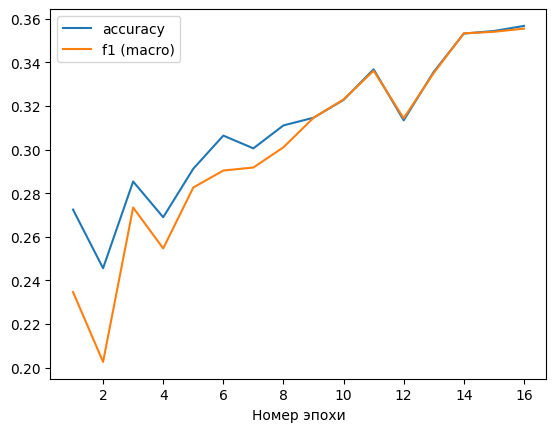

In [ ]:
plt.plot(range(1, 17), accuracy_history, label='accuracy')
plt.plot(range(1, 17), f1_history, label='f1 (macro)')

plt.legend()
plt.xlabel('Номер эпохи')

Text(0.5, 0, 'Номер эпохи')

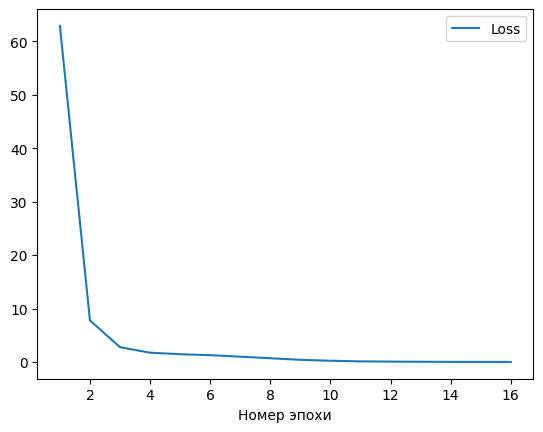

In [ ]:
plt.plot(range(1, 17), loss_history, label='Loss')

plt.legend()

plt.xlabel('Номер эпохи')

    Done 134/134 [size 32]

              precision    recall  f1-score   support

         0.0       0.17      0.44      0.24       232
         1.0       0.23      0.35      0.27       467
         2.0       0.18      0.36      0.24       472
         3.0       0.80      0.42      0.55      2597
         4.0       0.15      0.20      0.17       512

    accuracy                           0.38      4280
   macro avg       0.31      0.35      0.30      4280
weighted avg       0.56      0.38      0.42      4280



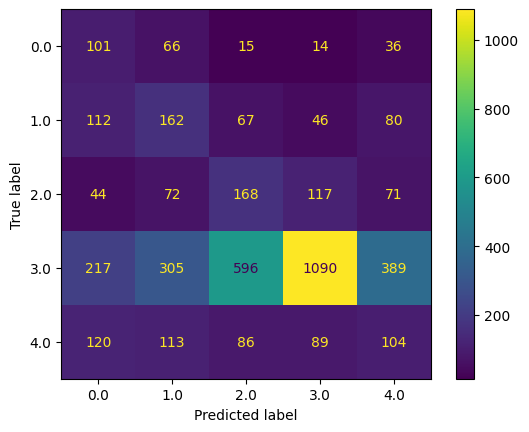

In [ ]:
tester(model.module.infer, test_dataloader, device)

## CNN + Adam + DataAugmentation

In [ ]:
transformAug = transforms.Compose([
    transforms.Resize((120, 160), antialias=True),
    transforms.RandomRotation(10),
    transforms.RandomHorizontalFlip(),
    transforms.RandomEqualize(p=0.3)
])

In [ ]:
dsAug = CustomImageDataset('/kaggle/working/train_sampled.csv', '/kaggle/input/cassava-leaf-disease-classification/train_images', transform=transformAug)

In [ ]:
trainAug_dataloader = DataLoader(dsAug, batch_size=32, shuffle=True)

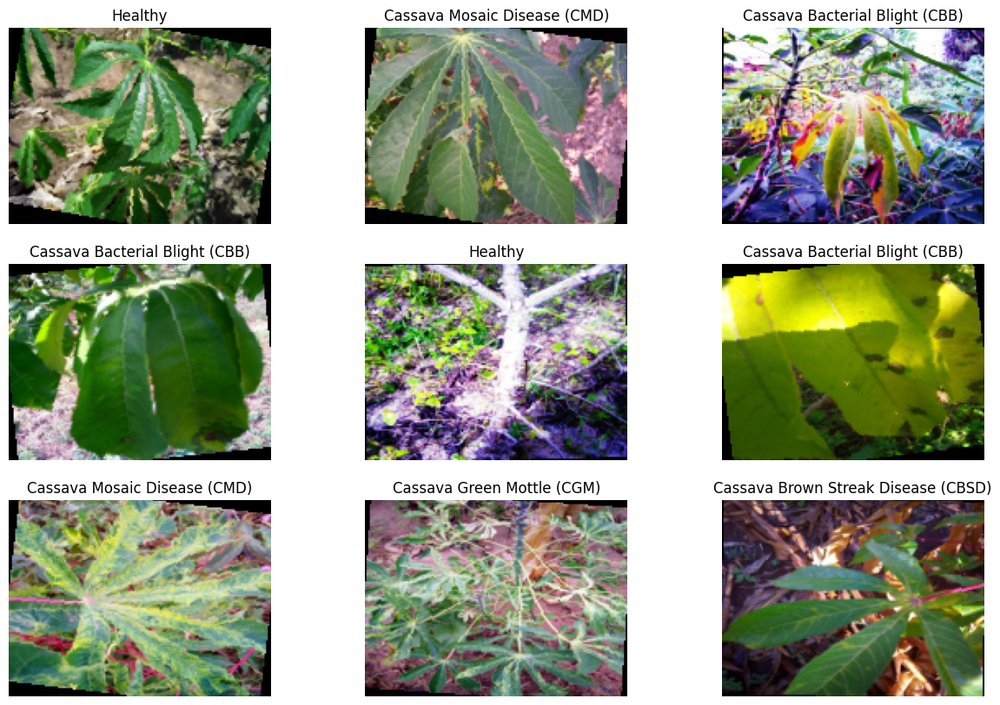

In [ ]:
plt.figure(figsize=(15, 10))

images, l = next(iter(trainAug_dataloader))

for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(np.moveaxis(images[i].numpy(), 0, -1))
    plt.title(labels[l[i]])

    plt.axis("off")

In [ ]:
class CNN(nn.Module):
    def __init__(self, init_weights: bool = True):
        super(CNN, self).__init__()

        self.classifier = nn.Sequential(
            nn.Conv2d(3, 16, 3),
            nn.ReLU(),
            nn.Conv2d(16, 32, 3),
            nn.ReLU(),
            nn.MaxPool2d(5, 2),
            nn.Conv2d(32, 48, 3),
            nn.ReLU(),
            nn.Conv2d(48, 64, 3),
            nn.ReLU(),
            nn.MaxPool2d(5, 2),
            nn.Conv2d(64, 96, 3),
            nn.ReLU(),
            nn.Conv2d(96, 128, 3),
            nn.ReLU(),
            nn.MaxPool2d(5, 2),
            Flatten(),
            nn.Linear(13312, 1024),
            nn.ReLU(),
            nn.Linear(1024, 512),
            nn.ReLU(),
            nn.Linear(512, 128),
            nn.Linear(128, 64),
            nn.ReLU(),
            nn.Linear(64, 5)
        )

        self.double()

        if init_weights:
            self.classifier.apply(self.init_weights)

    def init_weights(self, m):
        if isinstance(m, (nn.Linear, nn.Conv2d)):
            nn.init.kaiming_normal_(m.weight, mode='fan_in', nonlinearity='relu')
            nn.init.zeros_(m.bias)

    def forward(self, x):
        return self.classifier(x)

    def infer(self, x):
        p = None
        with torch.no_grad():
            p = self.classifier(x).argmax(dim=1)

        return p

In [ ]:
torch.cuda.empty_cache()

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

model = CNN()

if torch.cuda.device_count() > 1:
    print("Let's use", torch.cuda.device_count(), "GPUs!")
    model = nn.DataParallel(model)

model.to(device)

Let's use 2 GPUs!


DataParallel(
  (module): CNN(
    (classifier): Sequential(
      (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1))
      (1): ReLU()
      (2): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1))
      (3): ReLU()
      (4): MaxPool2d(kernel_size=5, stride=2, padding=0, dilation=1, ceil_mode=False)
      (5): Conv2d(32, 48, kernel_size=(3, 3), stride=(1, 1))
      (6): ReLU()
      (7): Conv2d(48, 64, kernel_size=(3, 3), stride=(1, 1))
      (8): ReLU()
      (9): MaxPool2d(kernel_size=5, stride=2, padding=0, dilation=1, ceil_mode=False)
      (10): Conv2d(64, 96, kernel_size=(3, 3), stride=(1, 1))
      (11): ReLU()
      (12): Conv2d(96, 128, kernel_size=(3, 3), stride=(1, 1))
      (13): ReLU()
      (14): MaxPool2d(kernel_size=5, stride=2, padding=0, dilation=1, ceil_mode=False)
      (15): Flatten()
      (16): Linear(in_features=13312, out_features=1024, bias=True)
      (17): ReLU()
      (18): Linear(in_features=1024, out_features=512, bias=True)
      (19): ReLU()
      (2

In [ ]:
optimizer = torch.optim.Adam(model.parameters(), lr=0.0001)
criterion = nn.CrossEntropyLoss()

In [ ]:
import IPython
from math import ceil

bs = train_dataloader.batch_size

total_b = ceil(len(ds) / bs)
total_val_b = ceil(len(val_ds) / bs)

n_epoch = 16

best_loss = float('inf')

loss_history = []
accuracy_history = []
f1_history = []

model.train()

for epoch in range(n_epoch):
    total_loss = 0
    steps = 0
    print(f'\nEpoch {epoch+1} of {n_epoch}')
    out = display(IPython.display.Pretty('Starting...'), display_id=True)
    for x, y in train_dataloader:
        optimizer.zero_grad()
        x = x.to(torch.double).to(device)
        y = y.to(device)
        output = model(x)

        loss = criterion(output, y)

        loss.backward()
        optimizer.step()

        x = x.to('cpu')
        y = y.to('cpu')

        del x
        del y

        total_loss += loss.item()
        steps += 1
        out.update(IPython.display.Pretty(f'  Done {steps}/{total_b} [size {bs}, lr {optimizer.param_groups[0]["lr"]}]\tLoss: {total_loss}'))

    print(f'  Loss per batch: {total_loss/total_b}')
    loss_history.append(total_loss/total_b)
    print('\n  Validation')
    out1 = display(IPython.display.Pretty('Starting validation...'), display_id=True)
    steps = 0
    y_pred = torch.Tensor().to(device)
    y_true = torch.Tensor()
    for x, y in val_dataloader:
        x = x.to(torch.double).to(device)
        pred = model.module.infer(x)
        y_pred = torch.cat([y_pred, pred], dim=0)
        y_true = torch.cat([y_true, y], dim=0)
        steps += 1
        out1.update(IPython.display.Pretty(f'    Done {steps}/{total_val_b} [size {bs}]'))

    acs = accuracy_score(y_true.numpy(), y_pred.to("cpu").numpy())
    f1s = f1_score(y_true.numpy(), y_pred.to("cpu").numpy(), average="macro")

    accuracy_history.append(acs)
    f1_history.append(f1s)

    print(f'    Accuracy: {acs}')
    print(f'    F1 (macro): {f1s}')

    if (total_loss < best_loss):
        torch.save(model.state_dict(), f'cnn_adam_aug_e{epoch+1}.pt')
        best_loss = total_loss


Epoch 1 of 16


  Done 107/107 [size 32, lr 0.0001]	Loss: 7994.771015960475

  Loss per batch: 74.71748613047173

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.2222222222222222
    F1 (macro): 0.17069428744379628

Epoch 2 of 16


  Done 107/107 [size 32, lr 0.0001]	Loss: 630.6656994032686

  Loss per batch: 5.894071957039894

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.26666666666666666
    F1 (macro): 0.21245659613730958

Epoch 3 of 16


  Done 107/107 [size 32, lr 0.0001]	Loss: 406.1118869548879

  Loss per batch: 3.795438195840074

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.27251461988304093
    F1 (macro): 0.26320236667207153

Epoch 4 of 16


  Done 107/107 [size 32, lr 0.0001]	Loss: 271.5650846066708

  Loss per batch: 2.537991444922157

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.2818713450292398
    F1 (macro): 0.26539871577076324

Epoch 5 of 16


  Done 107/107 [size 32, lr 0.0001]	Loss: 209.5430759846097

  Loss per batch: 1.9583465045290624

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.27485380116959063
    F1 (macro): 0.2715065506704175

Epoch 6 of 16


  Done 107/107 [size 32, lr 0.0001]	Loss: 168.49945584279575

  Loss per batch: 1.5747612695588389

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.27017543859649124
    F1 (macro): 0.26848084291187735

Epoch 7 of 16


  Done 107/107 [size 32, lr 0.0001]	Loss: 137.30125185517795

  Loss per batch: 1.2831892696745604

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.2935672514619883
    F1 (macro): 0.2886630808219509

Epoch 8 of 16


  Done 107/107 [size 32, lr 0.0001]	Loss: 105.98900213729142

  Loss per batch: 0.990551421843845

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.2795321637426901
    F1 (macro): 0.274400997100383

Epoch 9 of 16


  Done 107/107 [size 32, lr 0.0001]	Loss: 89.62004280251274

  Loss per batch: 0.8375704934814275

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.2982456140350877
    F1 (macro): 0.2983500637685822

Epoch 10 of 16


  Done 107/107 [size 32, lr 0.0001]	Loss: 68.7231207764118

  Loss per batch: 0.6422721567888954

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.30526315789473685
    F1 (macro): 0.3055067100104682

Epoch 11 of 16


  Done 107/107 [size 32, lr 0.0001]	Loss: 56.90803079973875

  Loss per batch: 0.5318507551377453

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.30058479532163745
    F1 (macro): 0.2994673351620417

Epoch 12 of 16


  Done 107/107 [size 32, lr 0.0001]	Loss: 42.059236931303936

  Loss per batch: 0.3930769806663919

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.28888888888888886
    F1 (macro): 0.28753108457561094

Epoch 13 of 16


  Done 107/107 [size 32, lr 0.0001]	Loss: 30.839280087265475

  Loss per batch: 0.2882175709090231

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.2830409356725146
    F1 (macro): 0.27860808050535146

Epoch 14 of 16


  Done 107/107 [size 32, lr 0.0001]	Loss: 23.39009465612873

  Loss per batch: 0.2185990154778386

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.2994152046783626
    F1 (macro): 0.2974605605798858

Epoch 15 of 16


  Done 107/107 [size 32, lr 0.0001]	Loss: 18.159887880960692

  Loss per batch: 0.16971857832673545

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.3087719298245614
    F1 (macro): 0.30727159438050794

Epoch 16 of 16


  Done 107/107 [size 32, lr 0.0001]	Loss: 14.10317132226299

  Loss per batch: 0.13180533946040177

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.2994152046783626
    F1 (macro): 0.2985716042346065


Text(0.5, 0, 'Номер эпохи')

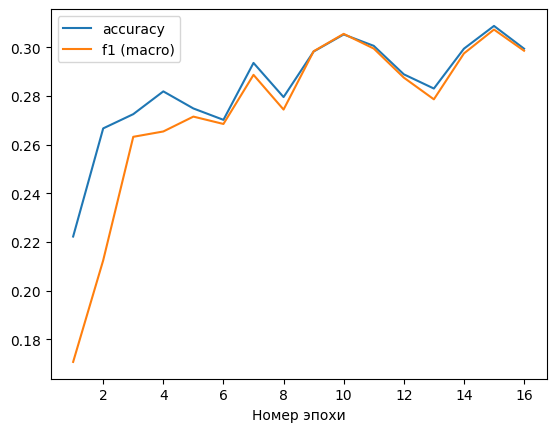

In [ ]:
plt.plot(range(1, 17), accuracy_history, label='accuracy')
plt.plot(range(1, 17), f1_history, label='f1 (macro)')

plt.legend()
plt.xlabel('Номер эпохи')

Text(0.5, 0, 'Номер эпохи')

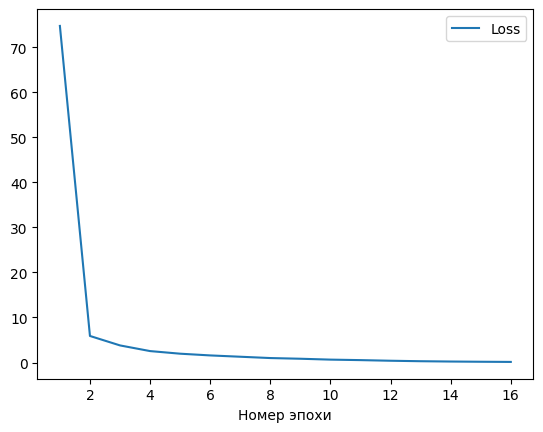

In [ ]:
plt.plot(range(1, 17), loss_history, label='Loss')

plt.legend()

plt.xlabel('Номер эпохи')

    Done 134/134 [size 32]

              precision    recall  f1-score   support

         0.0       0.17      0.40      0.24       232
         1.0       0.23      0.30      0.26       467
         2.0       0.15      0.35      0.21       472
         3.0       0.79      0.40      0.53      2597
         4.0       0.17      0.21      0.19       512

    accuracy                           0.36      4280
   macro avg       0.30      0.33      0.28      4280
weighted avg       0.55      0.36      0.41      4280



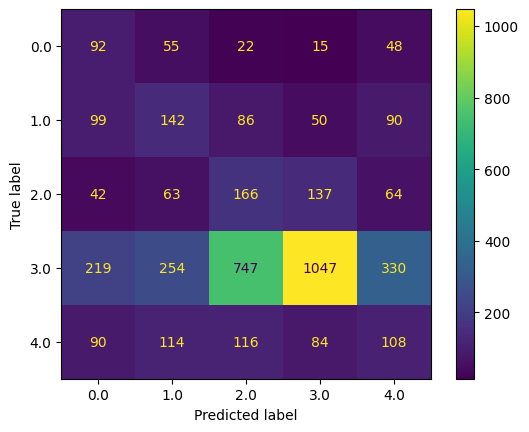

In [ ]:
tester(model.module.infer, test_dataloader, device)

## CNN + SGD + CyclicLR scheduler

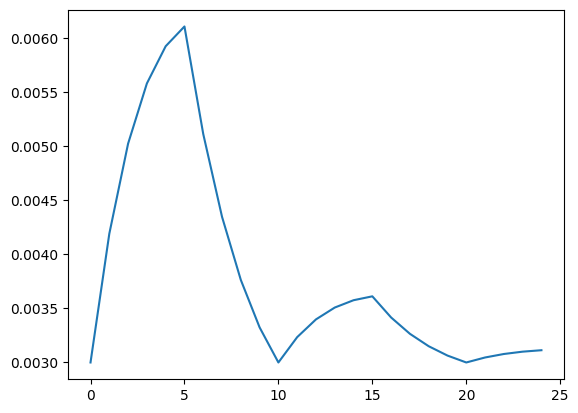

In [ ]:
model = torch.nn.Linear(2, 1)
optimizer = torch.optim.SGD(model.parameters(), lr=0.003)
scheduler = torch.optim.lr_scheduler.CyclicLR(optimizer, base_lr=0.003, max_lr=0.01,step_size_up=5,mode="exp_range",gamma=0.85)
lrs = []


for i in range(25):
    optimizer.step()
    lrs.append(optimizer.param_groups[0]["lr"])
    scheduler.step()

plt.plot(lrs)

In [ ]:
class CNN(nn.Module):
    def __init__(self, init_weights: bool = True):
        super(CNN, self).__init__()

        self.classifier = nn.Sequential(
            nn.Conv2d(3, 16, 3),
            nn.ReLU(),
            nn.Conv2d(16, 32, 3),
            nn.ReLU(),
            nn.MaxPool2d(5, 2),
            nn.Conv2d(32, 48, 3),
            nn.ReLU(),
            nn.Conv2d(48, 64, 3),
            nn.ReLU(),
            nn.MaxPool2d(5, 2),
            nn.Conv2d(64, 96, 3),
            nn.ReLU(),
            nn.Conv2d(96, 128, 3),
            nn.ReLU(),
            nn.MaxPool2d(5, 2),
            Flatten(),
            nn.Linear(13312, 1024),
            nn.ReLU(),
            nn.Linear(1024, 512),
            nn.ReLU(),
            nn.Linear(512, 128),
            nn.Linear(128, 64),
            nn.ReLU(),
            nn.Linear(64, 5)
        )

        self.double()

        if init_weights:
            self.classifier.apply(self.init_weights)

    def init_weights(self, m):
        if isinstance(m, (nn.Linear, nn.Conv2d)):
            nn.init.kaiming_normal_(m.weight, mode='fan_in', nonlinearity='relu')
            nn.init.zeros_(m.bias)

    def forward(self, x):
        return self.classifier(x)

    def infer(self, x):
        p = None
        with torch.no_grad():
            p = self.classifier(x).argmax(dim=1)

        return p

In [ ]:
torch.cuda.empty_cache()

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

model = CNN(False)

if torch.cuda.device_count() > 1:
    print("Let's use", torch.cuda.device_count(), "GPUs!")
    model = nn.DataParallel(model)

model.to(device)

Let's use 2 GPUs!


DataParallel(
  (module): CNN(
    (classifier): Sequential(
      (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1))
      (1): ReLU()
      (2): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1))
      (3): ReLU()
      (4): MaxPool2d(kernel_size=5, stride=2, padding=0, dilation=1, ceil_mode=False)
      (5): Conv2d(32, 48, kernel_size=(3, 3), stride=(1, 1))
      (6): ReLU()
      (7): Conv2d(48, 64, kernel_size=(3, 3), stride=(1, 1))
      (8): ReLU()
      (9): MaxPool2d(kernel_size=5, stride=2, padding=0, dilation=1, ceil_mode=False)
      (10): Conv2d(64, 96, kernel_size=(3, 3), stride=(1, 1))
      (11): ReLU()
      (12): Conv2d(96, 128, kernel_size=(3, 3), stride=(1, 1))
      (13): ReLU()
      (14): MaxPool2d(kernel_size=5, stride=2, padding=0, dilation=1, ceil_mode=False)
      (15): Flatten()
      (16): Linear(in_features=13312, out_features=1024, bias=True)
      (17): ReLU()
      (18): Linear(in_features=1024, out_features=512, bias=True)
      (19): ReLU()
      (2

In [ ]:
optimizer = torch.optim.SGD(model.parameters(), lr=0.003)
criterion = nn.CrossEntropyLoss()
scheduler = torch.optim.lr_scheduler.CyclicLR(
    optimizer,
    base_lr=0.003,
    max_lr=0.01,
    step_size_up=5,
    mode="exp_range",
    gamma=0.85
)

In [ ]:
import IPython
from math import ceil

bs = train_dataloader.batch_size

total_b = ceil(len(ds) / bs)
total_val_b = ceil(len(val_ds) / bs)

n_epoch = 25

best_loss = float('inf')

loss_history = []
accuracy_history = []
f1_history = []

model.train()

for epoch in range(n_epoch):
    total_loss = 0
    steps = 0
    print(f'\nEpoch {epoch+1} of {n_epoch}')
    out = display(IPython.display.Pretty('Starting...'), display_id=True)
    for x, y in train_dataloader:
        optimizer.zero_grad()
        x = x.to(torch.double).to(device)
        y = y.to(device)
        output = model(x)

        loss = criterion(output, y)

        loss.backward()
        optimizer.step()

        x = x.to('cpu')
        y = y.to('cpu')

        del x
        del y

        total_loss += loss.item()
        steps += 1
        out.update(IPython.display.Pretty(f'  Done {steps}/{total_b} [size {bs}, lr {optimizer.param_groups[0]["lr"]}]\tLoss: {total_loss}'))

    print(f'  Loss per batch: {total_loss/total_b}')
    loss_history.append(total_loss/total_b)
    print('\n  Validation')
    out1 = display(IPython.display.Pretty('Starting validation...'), display_id=True)
    steps = 0
    y_pred = torch.Tensor().to(device)
    y_true = torch.Tensor()
    for x, y in val_dataloader:
        x = x.to(torch.double).to(device)
        pred = model.module.infer(x)
        y_pred = torch.cat([y_pred, pred], dim=0)
        y_true = torch.cat([y_true, y], dim=0)
        steps += 1
        out1.update(IPython.display.Pretty(f'    Done {steps}/{total_val_b} [size {bs}]'))

    acs = accuracy_score(y_true.numpy(), y_pred.to("cpu").numpy())
    f1s = f1_score(y_true.numpy(), y_pred.to("cpu").numpy(), average="macro")

    accuracy_history.append(acs)
    f1_history.append(f1s)

    print(f'    Accuracy: {acs}')
    print(f'    F1 (macro): {f1s}')

    if (total_loss < best_loss):
        torch.save(model.state_dict(), f'cnn_sgd_sc_e{epoch+1}.pt')
        best_loss = total_loss

    scheduler.step()


Epoch 1 of 25


  Done 107/107 [size 32, lr 0.003]	Loss: 172.27139087356392

  Loss per batch: 1.6100129988183545

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.24561403508771928
    F1 (macro): 0.13638037661356242

Epoch 2 of 25


  Done 107/107 [size 32, lr 0.004190000000000001]	Loss: 171.3970364379302

  Loss per batch: 1.601841462036731

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.247953216374269
    F1 (macro): 0.1778348518027882

Epoch 3 of 25


  Done 107/107 [size 32, lr 0.005023]	Loss: 170.04232994660114

  Loss per batch: 1.5891806537065527

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.23157894736842105
    F1 (macro): 0.1326530612244898

Epoch 4 of 25


  Done 107/107 [size 32, lr 0.0055793249999999996]	Loss: 171.74042907776058

  Loss per batch: 1.6050507390444915

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.26783625730994154
    F1 (macro): 0.15569644216987624

Epoch 5 of 25


  Done 107/107 [size 32, lr 0.005923234999999999]	Loss: 166.6667227318634

  Loss per batch: 1.5576329227276953

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.1953216374269006
    F1 (macro): 0.06536203522504892

Epoch 6 of 25


  Done 107/107 [size 32, lr 0.0061059371875]	Loss: 163.3005278721105

  Loss per batch: 1.5261731576832758

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.28538011695906434
    F1 (macro): 0.1829730546168134

Epoch 7 of 25


  Done 107/107 [size 32, lr 0.005112037287499999]	Loss: 161.19774248400313

  Loss per batch: 1.5065209577944219

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.3064327485380117
    F1 (macro): 0.24235237032833606

Epoch 8 of 25


  Done 107/107 [size 32, lr 0.00434642377078125]	Loss: 158.00016652564884

  Loss per batch: 1.4766370703331666

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.3391812865497076
    F1 (macro): 0.2849068763704396

Epoch 9 of 25


  Done 107/107 [size 32, lr 0.003762973470109375]	Loss: 155.5834646525262

  Loss per batch: 1.4540510715189365

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.3298245614035088
    F1 (macro): 0.28185811431979835

Epoch 10 of 25


  Done 107/107 [size 32, lr 0.0033242637247964846]	Loss: 155.64959732479403

  Loss per batch: 1.4546691338765798

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.3087719298245614
    F1 (macro): 0.2537580714818284

Epoch 11 of 25


  Done 107/107 [size 32, lr 0.003]	Loss: 153.78249443853866

  Loss per batch: 1.43721957419195

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.34269005847953216
    F1 (macro): 0.2961082002044634

Epoch 12 of 25


  Done 107/107 [size 32, lr 0.00323428054116546]	Loss: 152.95458433174

  Loss per batch: 1.4294820965583177

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.3532163742690059
    F1 (macro): 0.3226601362038951

Epoch 13 of 25


  Done 107/107 [size 32, lr 0.003398276919981282]	Loss: 150.81089618655386

  Loss per batch: 1.4094476279117183

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.3216374269005848
    F1 (macro): 0.27009617844720957

Epoch 14 of 25


  Done 107/107 [size 32, lr 0.003507803072976134]	Loss: 150.3584264703662

  Loss per batch: 1.405218938975385

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.3508771929824561
    F1 (macro): 0.312743772029918

Epoch 15 of 25


  Done 107/107 [size 32, lr 0.003575510149372952]	Loss: 150.05207218247492

  Loss per batch: 1.4023558147894852

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.35906432748538014
    F1 (macro): 0.3211182982215848

Epoch 16 of 25


  Done 107/107 [size 32, lr 0.003611479533708762]	Loss: 148.393096076486

  Loss per batch: 1.3868513652008037

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.35789473684210527
    F1 (macro): 0.3177927609305983

Epoch 17 of 25


  Done 107/107 [size 32, lr 0.003415806082921958]	Loss: 146.58852728122554

  Loss per batch: 1.3699862362731359

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.27017543859649124
    F1 (macro): 0.2383759081540716

Epoch 18 of 25


  Done 107/107 [size 32, lr 0.003265076377862748]	Loss: 147.92467266982035

  Loss per batch: 1.3824735763534612

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.31812865497076026
    F1 (macro): 0.30839914908526345

Epoch 19 of 25


  Done 107/107 [size 32, lr 0.0031502099474555573]	Loss: 144.7530272386995

  Loss per batch: 1.3528320302682197

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.3684210526315789
    F1 (macro): 0.3198049369450105

Epoch 20 of 25


  Done 107/107 [size 32, lr 0.003063839227668612]	Loss: 145.32378323690926

  Loss per batch: 1.3581661984757876

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.37660818713450295
    F1 (macro): 0.3549195582379111

Epoch 21 of 25


  Done 107/107 [size 32, lr 0.003]	Loss: 143.35368010870204

  Loss per batch: 1.3397540197074957

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.3707602339181287
    F1 (macro): 0.340264317963742

Epoch 22 of 25


  Done 107/107 [size 32, lr 0.0030461238419905723]	Loss: 141.96793359923456

  Loss per batch: 1.3268031177498556

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.3298245614035088
    F1 (macro): 0.3088431440964717

Epoch 23 of 25


  Done 107/107 [size 32, lr 0.0030784105313839726]	Loss: 139.46248871232075

  Loss per batch: 1.3033877449749602

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.32514619883040935
    F1 (macro): 0.29053408493352834

Epoch 24 of 25


  Done 107/107 [size 32, lr 0.0030999734275145648]	Loss: 136.5661881532539

  Loss per batch: 1.276319515450971

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.3485380116959064
    F1 (macro): 0.33959751329503096

Epoch 25 of 25


  Done 107/107 [size 32, lr 0.00311330321784984]	Loss: 131.18552077310855

  Loss per batch: 1.2260329044215752

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.34152046783625734
    F1 (macro): 0.3430013291808559


Text(0.5, 0, 'Номер эпохи')

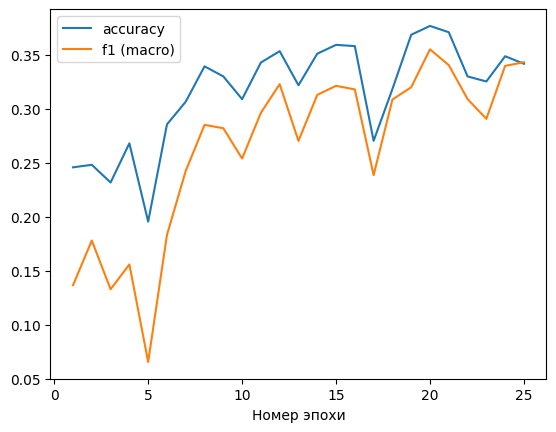

In [ ]:
plt.plot(range(1, 26), accuracy_history, label='accuracy')
plt.plot(range(1, 26), f1_history, label='f1 (macro)')

plt.legend()
plt.xlabel('Номер эпохи')

Text(0.5, 0, 'Номер эпохи')

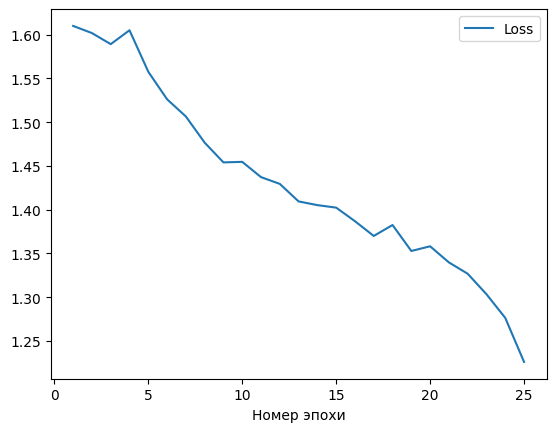

In [ ]:
plt.plot(range(1, 26), loss_history, label='Loss')

plt.legend()

plt.xlabel('Номер эпохи')

    Done 134/134 [size 32]

              precision    recall  f1-score   support

         0.0       0.31      0.36      0.33       232
         1.0       0.22      0.42      0.29       467
         2.0       0.17      0.33      0.23       472
         3.0       0.85      0.48      0.61      2597
         4.0       0.23      0.32      0.27       512

    accuracy                           0.43      4280
   macro avg       0.35      0.38      0.34      4280
weighted avg       0.60      0.43      0.48      4280



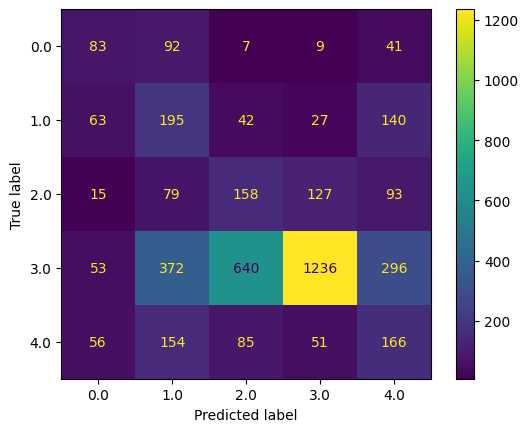

In [ ]:
tester(model.module.infer, test_dataloader, device)

## Результаты

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

model_vis = nn.DataParallel(CNN(init_weights=False))
model_vis.load_state_dict(torch.load('/kaggle/input/cnn_adam_dataaugmentation/pytorch/epoch16loss2/1/cnn_adam_aug_e16.pt'))
model_vis.to(device)
model_vis.eval()

DataParallel(
  (module): CNN(
    (classifier): Sequential(
      (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1))
      (1): ReLU()
      (2): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1))
      (3): ReLU()
      (4): MaxPool2d(kernel_size=5, stride=2, padding=0, dilation=1, ceil_mode=False)
      (5): Conv2d(32, 48, kernel_size=(3, 3), stride=(1, 1))
      (6): ReLU()
      (7): Conv2d(48, 64, kernel_size=(3, 3), stride=(1, 1))
      (8): ReLU()
      (9): MaxPool2d(kernel_size=5, stride=2, padding=0, dilation=1, ceil_mode=False)
      (10): Conv2d(64, 96, kernel_size=(3, 3), stride=(1, 1))
      (11): ReLU()
      (12): Conv2d(96, 128, kernel_size=(3, 3), stride=(1, 1))
      (13): ReLU()
      (14): MaxPool2d(kernel_size=5, stride=2, padding=0, dilation=1, ceil_mode=False)
      (15): Flatten()
      (16): Linear(in_features=13312, out_features=1024, bias=True)
      (17): ReLU()
      (18): Linear(in_features=1024, out_features=512, bias=True)
      (19): ReLU()
      (2

In [ ]:
vis_modules = [module for module in model_vis.module.classifier.modules() if isinstance(module, nn.Conv2d)]
vis_modules

[Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1)),
 Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1)),
 Conv2d(32, 48, kernel_size=(3, 3), stride=(1, 1)),
 Conv2d(48, 64, kernel_size=(3, 3), stride=(1, 1)),
 Conv2d(64, 96, kernel_size=(3, 3), stride=(1, 1)),
 Conv2d(96, 128, kernel_size=(3, 3), stride=(1, 1))]

In [ ]:
input_img_data = np.random.random((1, 3, 120, 160)) * 20 + 128
input_img_data[0].shape

In [ ]:
from torchvision import utils

In [ ]:
 def visTensor(tensor, ch=0, allkernels=False, nrow=8, padding=1):
    n,c,w,h = tensor.shape

    if allkernels: tensor = tensor.view(n*c, -1, w, h)
    elif c != 3: tensor = tensor[:,ch,:,:].unsqueeze(dim=1)

    rows = np.min((tensor.shape[0] // nrow + 1, 64))
    grid = utils.make_grid(tensor, nrow=nrow, normalize=True, padding=padding)
    plt.figure( figsize=(nrow,rows) )
    plt.imshow(grid.numpy().transpose((1, 2, 0)))

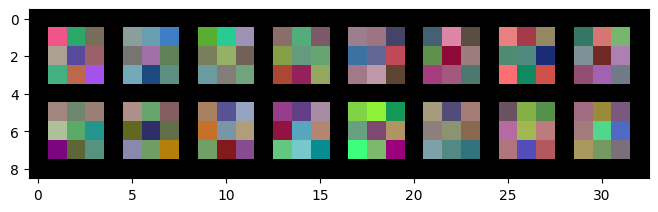

In [ ]:
visTensor(vis_modules[0].weight.cpu().data.clone())

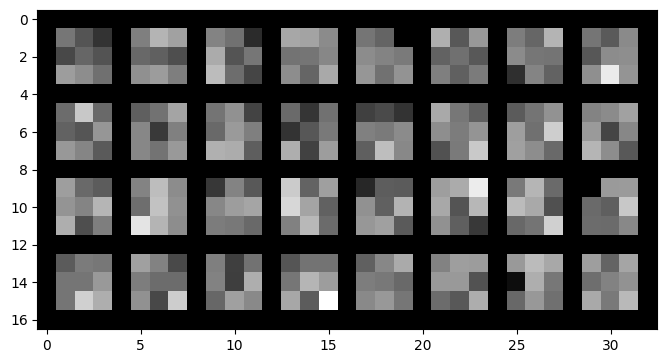

In [ ]:
visTensor(vis_modules[1].weight.cpu().data.clone())

In [ ]:
from tqdm import trange

In [ ]:
results = []
with torch.no_grad():
    results.append(vis_modules[0](ds[0][0].to(torch.double).to(device)))
    for i in trange(1, len(vis_modules)):
        results.append(vis_modules[i](results[-1]))
outputs = results

100%|██████████| 5/5 [00:00<00:00, 1692.34it/s]


In [ ]:
outputs = list(map(lambda x: x.cpu(), outputs))

torch.Size([16, 118, 158])


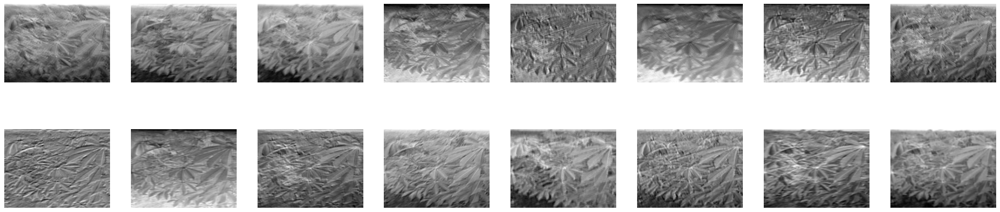

torch.Size([32, 116, 156])


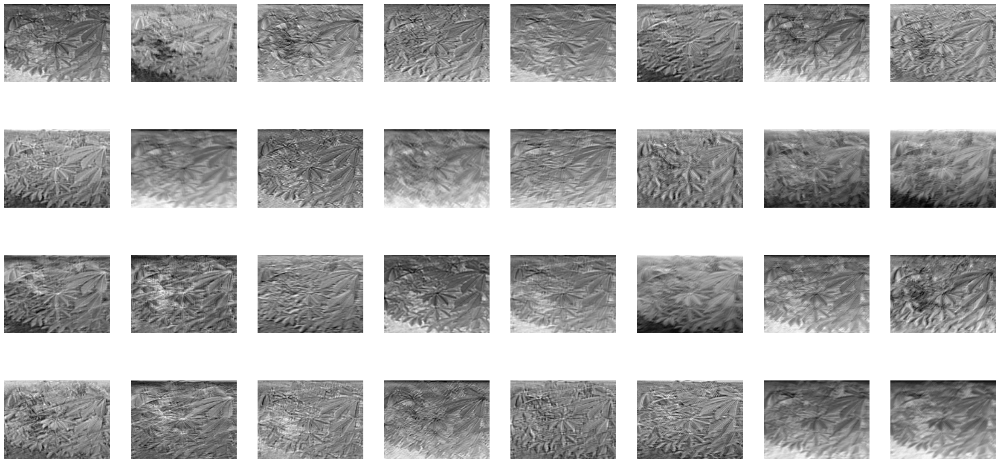

torch.Size([48, 114, 154])


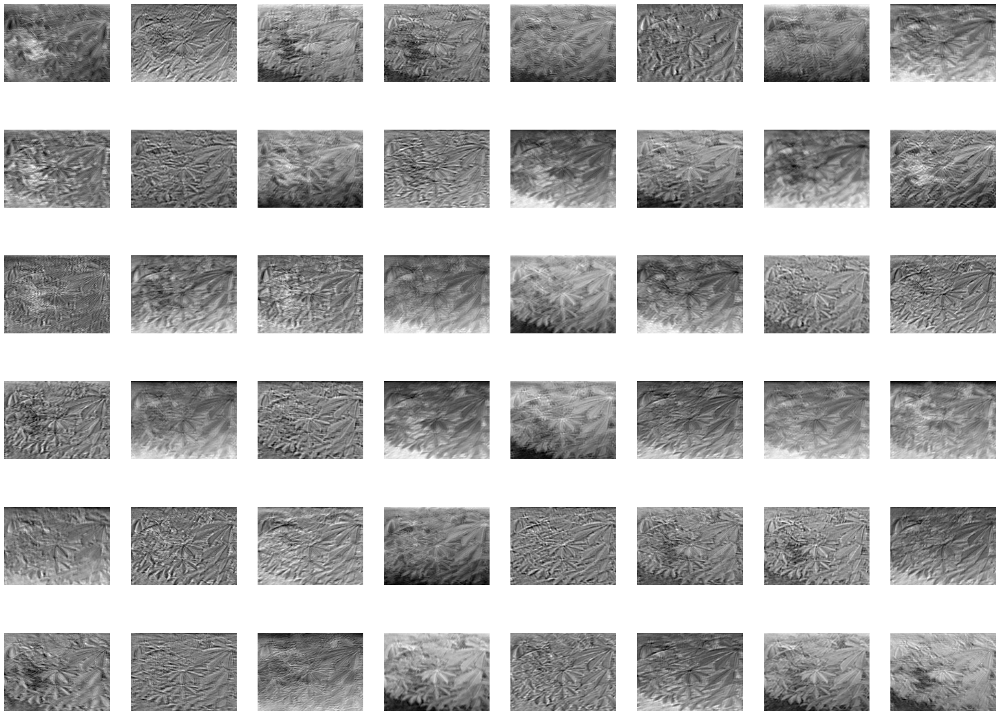

torch.Size([64, 112, 152])


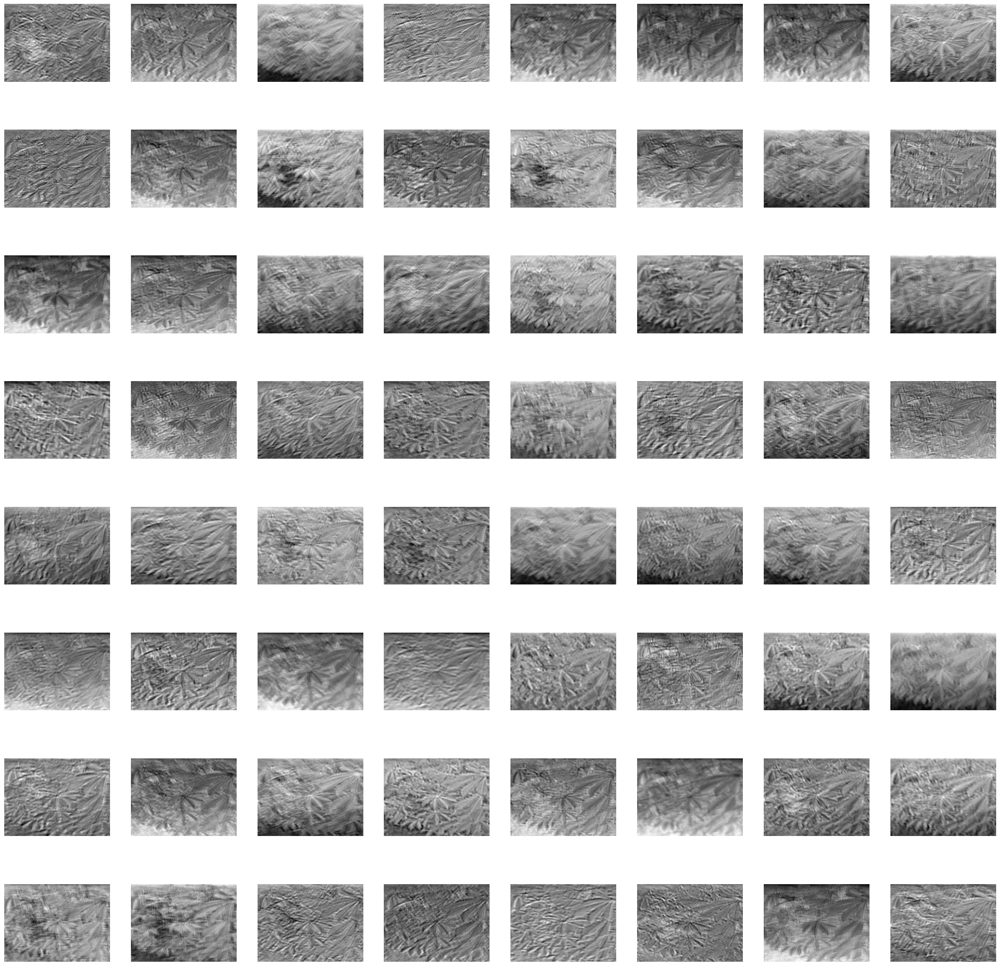

<Figure size 3000x3000 with 0 Axes>

In [ ]:
for num_layer in range(len(outputs)):
    plt.figure(figsize=(30, 30))
    layer_viz = outputs[num_layer][:,:,:]
    layer_viz = layer_viz.data
    if layer_viz.size()[0] > 64:
        break
    print(layer_viz.size())
    for i, filter in enumerate(layer_viz):
        plt.subplot(8, 8, i + 1)
        plt.imshow(filter, cmap='gray')
        plt.axis("off")
    plt.show()

In [ ]:
results_table = prettytable.PrettyTable()

results_table.field_names = ['Эксперемент', 'Train accuracy', 'Train f1 (macro)']
results_table.add_row(['CNN + SGD', 0.57, 0.38])
results_table.add_row(['CNN + Adam', 0.36, 0.29])
results_table.add_row(['CNN + Adam + CyclicLR', 0.38, 0.3])
results_table.add_row(['CNN + Adam + Data aug', 0.36, 0.28])
results_table.add_row(['CNN + SGD + CyclicLR', 0.43, 0.34])

print(results_table)

+-----------------------+----------------+------------------+
|      Эксперемент      | Train accuracy | Train f1 (macro) |
+-----------------------+----------------+------------------+
|       CNN + SGD       |      0.57      |       0.38       |
|       CNN + Adam      |      0.36      |       0.29       |
| CNN + Adam + CyclicLR |      0.38      |       0.3        |
| CNN + Adam + Data aug |      0.36      |       0.28       |
|  CNN + SGD + CyclicLR |      0.43      |       0.34       |
+-----------------------+----------------+------------------+


## GoogLeNet

In [ ]:
from torchvision.models import googlenet

In [ ]:
torch.cuda.empty_cache()

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [ ]:
gCNN = googlenet(weights='DEFAULT')

In [ ]:
gCNN.fc = nn.Linear(1024, 5)
gCNN.to(device)
gCNN.eval()

GoogLeNet(
  (conv1): BasicConv2d(
    (conv): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (maxpool1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
  (conv2): BasicConv2d(
    (conv): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (conv3): BasicConv2d(
    (conv): Conv2d(64, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(192, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (maxpool2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
  (inception3a): Inception(
    (branch1): BasicConv2d(
      (conv): Conv2d(192, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track

In [ ]:
for p in gCNN.parameters():
    p.requires_grad = False

for p in gCNN.fc.parameters():
    p.requires_grad = True

In [ ]:
optimizer = torch.optim.Adam(gCNN.parameters(), lr=0.0001)
criterion = nn.CrossEntropyLoss()

In [ ]:
import IPython
from math import ceil

bs = train_dataloader.batch_size

total_b = ceil(len(ds) / bs)
total_val_b = ceil(len(val_ds) / bs)

n_epoch = 25

best_loss = float('inf')

loss_history = []
accuracy_history = []
f1_history = []

gCNN.train()

for epoch in range(n_epoch):
    total_loss = 0
    steps = 0
    print(f'\nEpoch {epoch+1} of {n_epoch}')
    out = display(IPython.display.Pretty('Starting...'), display_id=True)
    for x, y in train_dataloader:
        optimizer.zero_grad()
        x = x.to(device)
        y = y.to(device)
        output = gCNN(x)

        loss = criterion(output, y)

        loss.backward()
        optimizer.step()

        x = x.to('cpu')
        y = y.to('cpu')

        del x
        del y

        total_loss += loss.item()
        steps += 1
        out.update(IPython.display.Pretty(f'  Done {steps}/{total_b} [size {bs}, lr {optimizer.param_groups[0]["lr"]}]\tLoss: {total_loss}'))

    print(f'  Loss per batch: {total_loss/total_b}')
    loss_history.append(total_loss/total_b)
    print('\n  Validation')
    out1 = display(IPython.display.Pretty('Starting validation...'), display_id=True)
    steps = 0
    y_pred = torch.Tensor().to(device)
    y_true = torch.Tensor()
    with torch.no_grad():
        for x, y in val_dataloader:
            x = x.to(device)
            pred = gCNN(x).argmax(dim=1)
            y_pred = torch.cat([y_pred, pred], dim=0)
            y_true = torch.cat([y_true, y], dim=0)
            steps += 1
            out1.update(IPython.display.Pretty(f'    Done {steps}/{total_val_b} [size {bs}]'))

    acs = accuracy_score(y_true.numpy(), y_pred.to("cpu").numpy())
    f1s = f1_score(y_true.numpy(), y_pred.to("cpu").numpy(), average="macro")

    accuracy_history.append(acs)
    f1_history.append(f1s)

    print(f'    Accuracy: {acs}')
    print(f'    F1 (macro): {f1s}')


Epoch 1 of 25


  Done 107/107 [size 32, lr 0.0001]	Loss: 169.49705600738525

  Loss per batch: 1.5840846355830398

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.30760233918128654
    F1 (macro): 0.30234882236281224

Epoch 2 of 25


  Done 107/107 [size 32, lr 0.0001]	Loss: 162.48811554908752

  Loss per batch: 1.5185805191503507

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.3345029239766082
    F1 (macro): 0.33047913165331416

Epoch 3 of 25


  Done 107/107 [size 32, lr 0.0001]	Loss: 157.1793076992035

  Loss per batch: 1.4689654925159206

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.3649122807017544
    F1 (macro): 0.36071736108616026

Epoch 4 of 25


  Done 107/107 [size 32, lr 0.0001]	Loss: 153.08252668380737

  Loss per batch: 1.4306778194748353

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.37894736842105264
    F1 (macro): 0.36276958844356677

Epoch 5 of 25


  Done 107/107 [size 32, lr 0.0001]	Loss: 150.01546239852905

  Loss per batch: 1.4020136672759724

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.3871345029239766
    F1 (macro): 0.3726641071063796

Epoch 6 of 25


  Done 107/107 [size 32, lr 0.0001]	Loss: 147.10145211219788

  Loss per batch: 1.3747799262822231

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.4
    F1 (macro): 0.39463474352593336

Epoch 7 of 25


  Done 107/107 [size 32, lr 0.0001]	Loss: 144.71942520141602

  Loss per batch: 1.3525179925365982

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.4070175438596491
    F1 (macro): 0.40178096338646097

Epoch 8 of 25


  Done 107/107 [size 32, lr 0.0001]	Loss: 142.66850244998932

  Loss per batch: 1.333350490186816

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.41871345029239765
    F1 (macro): 0.4176772925613146

Epoch 9 of 25


  Done 107/107 [size 32, lr 0.0001]	Loss: 141.8854035139084

  Loss per batch: 1.3260318085412

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.4023391812865497
    F1 (macro): 0.3982018819303391

Epoch 10 of 25


  Done 107/107 [size 32, lr 0.0001]	Loss: 139.30221378803253

  Loss per batch: 1.3018898484862853

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.42923976608187137
    F1 (macro): 0.4179991849548398

Epoch 11 of 25


  Done 107/107 [size 32, lr 0.0001]	Loss: 138.77594327926636

  Loss per batch: 1.296971432516508

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.43742690058479533
    F1 (macro): 0.4316574085933347

Epoch 12 of 25


  Done 107/107 [size 32, lr 0.0001]	Loss: 137.47599029541016

  Loss per batch: 1.2848223392094407

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.41637426900584795
    F1 (macro): 0.4120464240755388

Epoch 13 of 25


  Done 107/107 [size 32, lr 0.0001]	Loss: 135.9595695734024

  Loss per batch: 1.2706501829289945

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.41169590643274856
    F1 (macro): 0.40818743580746564

Epoch 14 of 25


  Done 107/107 [size 32, lr 0.0001]	Loss: 136.5392291545868

  Loss per batch: 1.2760675621924

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.4327485380116959
    F1 (macro): 0.4279929966559736

Epoch 15 of 25


  Done 107/107 [size 32, lr 0.0001]	Loss: 134.99189466238022

  Loss per batch: 1.2616064921717778

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.44912280701754387
    F1 (macro): 0.4456915269268009

Epoch 16 of 25


  Done 107/107 [size 32, lr 0.0001]	Loss: 135.0088540315628

  Loss per batch: 1.261764990949185

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.447953216374269
    F1 (macro): 0.44240077909919623

Epoch 17 of 25


  Done 107/107 [size 32, lr 0.0001]	Loss: 133.86878192424774

  Loss per batch: 1.2511101114415677

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.4280701754385965
    F1 (macro): 0.42668440361817234

Epoch 18 of 25


  Done 107/107 [size 32, lr 0.0001]	Loss: 133.48592066764832

  Loss per batch: 1.2475319688565263

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.39766081871345027
    F1 (macro): 0.39406131696725893

Epoch 19 of 25


  Done 107/107 [size 32, lr 0.0001]	Loss: 132.84396171569824

  Loss per batch: 1.2415323524831612

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.4304093567251462
    F1 (macro): 0.42525815357637897

Epoch 20 of 25


  Done 107/107 [size 32, lr 0.0001]	Loss: 132.1975263953209

  Loss per batch: 1.2354909008908495

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.43508771929824563
    F1 (macro): 0.43224355629950073

Epoch 21 of 25


  Done 107/107 [size 32, lr 0.0001]	Loss: 132.83552408218384

  Loss per batch: 1.241453496095176

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.43508771929824563
    F1 (macro): 0.42809314533627313

Epoch 22 of 25


  Done 107/107 [size 32, lr 0.0001]	Loss: 131.106543302536

  Loss per batch: 1.2252947972199628

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.43391812865497076
    F1 (macro): 0.43049568596677024

Epoch 23 of 25


  Done 107/107 [size 32, lr 0.0001]	Loss: 130.90873801708221

  Loss per batch: 1.2234461496923572

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.4456140350877193
    F1 (macro): 0.4417759710711994

Epoch 24 of 25


  Done 107/107 [size 32, lr 0.0001]	Loss: 131.8621824979782

  Loss per batch: 1.2323568457754972

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.4421052631578947
    F1 (macro): 0.43865713745713164

Epoch 25 of 25


  Done 107/107 [size 32, lr 0.0001]	Loss: 130.05493319034576

  Loss per batch: 1.2154666653303343

  Validation


    Done 27/27 [size 32]

    Accuracy: 0.41871345029239765
    F1 (macro): 0.4141749844281607


In [ ]:
%%capture

gCNN.eval()

In [ ]:
from typing import Callable

def tester(inferFunc: Callable, test_loader: DataLoader, device: str = 'cpu') -> None:
    out = display(IPython.display.Pretty('Starting testing...'), display_id=True)
    steps = 0
    y_pred = torch.Tensor().to(device)
    y_true = torch.Tensor()
    with torch.no_grad():
        for x, y in test_loader:
            x = x.to(device)
            pred = inferFunc(x).argmax(dim=1)
            y_pred = torch.cat([y_pred, pred], dim=0)
            y_true = torch.cat([y_true, y], dim=0)
            steps += 1
            out.update(IPython.display.Pretty(f'    Done {steps}/{len(test_loader)} [size {test_loader.batch_size}]'))

    print(classification_report(y_true.numpy(), y_pred.to('cpu').numpy()))
    ConfusionMatrixDisplay.from_predictions(y_true.numpy(), y_pred.to('cpu').numpy())

    Done 134/134 [size 32]

              precision    recall  f1-score   support

         0.0       0.28      0.62      0.39       232
         1.0       0.37      0.35      0.36       467
         2.0       0.21      0.39      0.27       472
         3.0       0.85      0.64      0.73      2597
         4.0       0.36      0.33      0.35       512

    accuracy                           0.55      4280
   macro avg       0.41      0.47      0.42      4280
weighted avg       0.64      0.55      0.58      4280



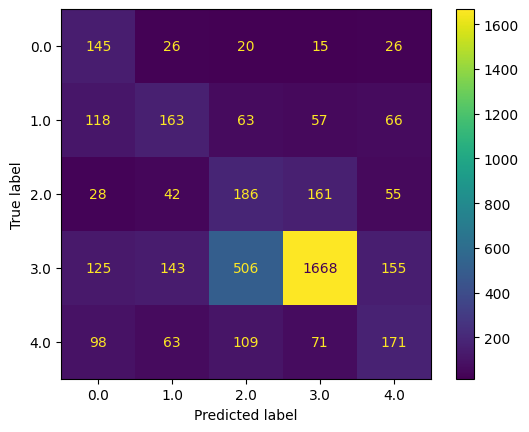

In [ ]:
tester(gCNN, test_dataloader, device)

# 2 Image Segmentation

In [ ]:
imgs_path = '/kaggle/input/semantic-drone-dataset/dataset/semantic_drone_dataset/original_images'
masks_path = '/kaggle/input/semantic-drone-dataset/dataset/semantic_drone_dataset/label_images_semantic'

In [ ]:
colors = dict(list(map(lambda x: (x[0], (x[1], x[2], x[3])), pd.read_csv('/kaggle/input/semantic-drone-dataset/class_dict_seg.csv').values)))
colors

{'unlabeled': (0, 0, 0),
 'paved-area': (128, 64, 128),
 'dirt': (130, 76, 0),
 'grass': (0, 102, 0),
 'gravel': (112, 103, 87),
 'water': (28, 42, 168),
 'rocks': (48, 41, 30),
 'pool': (0, 50, 89),
 'vegetation': (107, 142, 35),
 'roof': (70, 70, 70),
 'wall': (102, 102, 156),
 'window': (254, 228, 12),
 'door': (254, 148, 12),
 'fence': (190, 153, 153),
 'fence-pole': (153, 153, 153),
 'person': (255, 22, 96),
 'dog': (102, 51, 0),
 'car': (9, 143, 150),
 'bicycle': (119, 11, 32),
 'tree': (51, 51, 0),
 'bald-tree': (190, 250, 190),
 'ar-marker': (112, 150, 146),
 'obstacle': (2, 135, 115),
 'conflicting': (255, 0, 0)}

In [ ]:
classes = list(colors.keys())

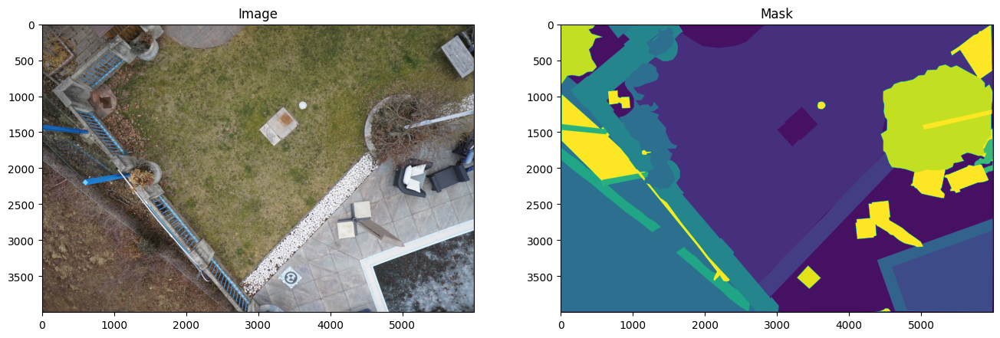

In [ ]:
image = read_image(os.path.join(imgs_path, '208.jpg'))
mask = read_image(os.path.join(masks_path, '208.png'))

plt.figure(figsize=(16, 8))
plt.subplot(121)
plt.title("Image")
plt.imshow(image.permute(1, 2, 0))
plt.subplot(122)
plt.title("Mask")
plt.imshow(mask.permute(1, 2, 0))

In [ ]:
class SegDataset(Dataset):
    def __init__(self, path_images, path_segs, image_transform, mask_transform, label_colors_list, classes):
        print(f"TRAINING ON CLASSES: {classes}")

        self.path_images = path_images
        self.path_segs = path_segs
        self.label_colors_list = label_colors_list
        self.image_transform = image_transform
        self.mask_transform = mask_transform

        self.imgs = list(sorted(os.listdir(path_images)))
        self.masks = list(sorted(os.listdir(path_segs)))

        self.class_values = list(range(len(classes)))

    def __len__(self):
        return len(self.imgs)

    def __getitem__(self, index):
        image = read_image(os.path.join(self.path_images, self.imgs[index])).to(torch.float)
        mask = read_image(os.path.join(self.path_segs, self.masks[index])).to(torch.long)

        image = self.image_transform(image)
        mask = self.mask_transform(mask).squeeze()

        return image, mask

transform = transforms.Compose([
    transforms.Resize((224, 320), antialias=True),
])

train_dataset = SegDataset(imgs_path, masks_path, transform,
                              transform,
                              list(colors.values()),
                              classes=list(colors.keys()))

train_data_loader = DataLoader(train_dataset, batch_size=5)

TRAINING ON CLASSES: ['unlabeled', 'paved-area', 'dirt', 'grass', 'gravel', 'water', 'rocks', 'pool', 'vegetation', 'roof', 'wall', 'window', 'door', 'fence', 'fence-pole', 'person', 'dog', 'car', 'bicycle', 'tree', 'bald-tree', 'ar-marker', 'obstacle', 'conflicting']


In [ ]:
!pip install segmentation_models_pytorch

In [ ]:
import segmentation_models_pytorch as smp

## Unet architecture

In [ ]:
model = smp.Unet(
    encoder_name="timm-mobilenetv3_large_minimal_100",
    encoder_weights="imagenet",
    in_channels=3,
    classes=len(classes),
)

model

Downloading: "https://github.com/rwightman/pytorch-image-models/releases/download/v0.1-weights/tf_mobilenetv3_large_minimal_100-8596ae28.pth" to /root/.cache/torch/hub/checkpoints/tf_mobilenetv3_large_minimal_100-8596ae28.pth
100%|██████████| 15.1M/15.1M [00:00<00:00, 45.0MB/s]


Unet(
  (encoder): MobileNetV3Encoder(
    (model): MobileNetV3Features(
      (conv_stem): Conv2dSame(3, 16, kernel_size=(3, 3), stride=(2, 2), bias=False)
      (bn1): BatchNorm2d(16, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
      (act1): ReLU(inplace=True)
      (blocks): Sequential(
        (0): Sequential(
          (0): DepthwiseSeparableConv(
            (conv_dw): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=16, bias=False)
            (bn1): BatchNormAct2d(
              16, eps=0.001, momentum=0.1, affine=True, track_running_stats=True
              (drop): Identity()
              (act): ReLU(inplace=True)
            )
            (se): Identity()
            (conv_pw): Conv2d(16, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
            (bn2): BatchNormAct2d(
              16, eps=0.001, momentum=0.1, affine=True, track_running_stats=True
              (drop): Identity()
              (act): Identity()
            )
 

In [ ]:
for p in model.parameters():
    p.requires_grad = False

for p in model.segmentation_head.parameters():
    p.requires_grad = True

for p in model.decoder.parameters():
    p.requires_grad = True

In [ ]:
torch.cuda.empty_cache()

In [ ]:
%%capture

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model.to(device)

In [ ]:
parameters = [p for p in model.parameters() if p.requires_grad]

optimizer = torch.optim.Adam(parameters, lr=0.0001)
criterion = nn.CrossEntropyLoss()

In [ ]:
from tqdm import tqdm
from math import ceil

bs = train_data_loader.batch_size

total_b = ceil(len(train_dataset) / bs)

n_epoch = 5

loss_history = []
accuracy_history = []
f1_history = []

model.train()

for epoch in range(1, n_epoch+1):
    total_loss = 0
    with tqdm(train_data_loader, total=total_b) as loader:
        loader.set_description_str(f'Epoch {epoch} of {n_epoch}')
        step = 0
        for x, y in loader:
            optimizer.zero_grad()
            x = x.to(device)
            y = y.to(device)
            output = model(x)

            loss = criterion(output, y)

            loss.backward()
            optimizer.step()

            x = x.to('cpu')
            y = y.to('cpu')

            del x
            del y

            total_loss += loss.item()
            step += 1
            loader.set_postfix_str('Loss: {:.5f}, Loss per batch: {:.5f}'.format(total_loss, total_loss/step))
        loss_history.append(total_loss/total_b)

Epoch 5 of 5: 100%|██████████| 80/80 [04:34<00:00,  3.43s/it, Loss: 113.77428, Loss per batch: 1.42218]


In [ ]:
from tqdm import tqdm
from math import ceil

bs = train_data_loader.batch_size

total_b = ceil(len(train_dataset) / bs)

n_epoch = 15

loss_history = []
accuracy_history = []
f1_history = []

model.train()

for epoch in range(6, n_epoch+1):
    total_loss = 0
    with tqdm(train_data_loader, total=total_b) as loader:
        loader.set_description_str(f'Epoch {epoch} of {n_epoch}')
        step = 0
        for x, y in loader:
            optimizer.zero_grad()
            x = x.to(device)
            y = y.to(device)
            output = model(x)

            loss = criterion(output, y)

            loss.backward()
            optimizer.step()

            x = x.to('cpu')
            y = y.to('cpu')

            del x
            del y

            total_loss += loss.item()
            step += 1
            loader.set_postfix_str('Loss: {:.5f}, Loss per batch: {:.5f}'.format(total_loss, total_loss/step))
        loss_history.append(total_loss/total_b)

Epoch 15 of 15: 100%|██████████| 80/80 [04:28<00:00,  3.36s/it, Loss: 72.39030, Loss per batch: 0.90488]


In [ ]:
im, ma = train_dataset[26]

r = model(im.unsqueeze(0).to(device))

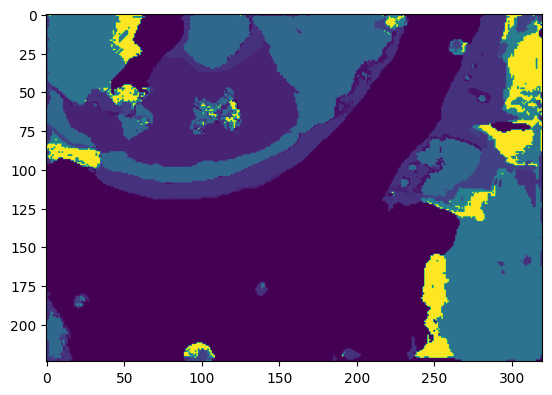

In [ ]:
plt.imshow(r.squeeze().cpu().argmax(dim=0))

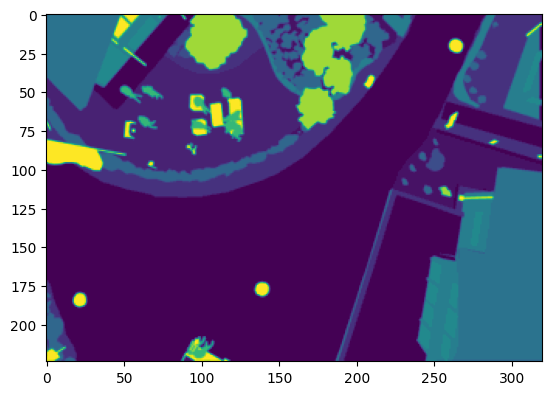

In [ ]:
plt.imshow(ma.squeeze().to(torch.uint8))

## FPN architecture

In [ ]:
model = smp.FPN(
    encoder_name="timm-mobilenetv3_large_minimal_100",
    encoder_weights="imagenet",
    in_channels=3,
    classes=len(classes),
)

model

FPN(
  (encoder): MobileNetV3Encoder(
    (model): MobileNetV3Features(
      (conv_stem): Conv2dSame(3, 16, kernel_size=(3, 3), stride=(2, 2), bias=False)
      (bn1): BatchNorm2d(16, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
      (act1): ReLU(inplace=True)
      (blocks): Sequential(
        (0): Sequential(
          (0): DepthwiseSeparableConv(
            (conv_dw): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=16, bias=False)
            (bn1): BatchNormAct2d(
              16, eps=0.001, momentum=0.1, affine=True, track_running_stats=True
              (drop): Identity()
              (act): ReLU(inplace=True)
            )
            (se): Identity()
            (conv_pw): Conv2d(16, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
            (bn2): BatchNormAct2d(
              16, eps=0.001, momentum=0.1, affine=True, track_running_stats=True
              (drop): Identity()
              (act): Identity()
            )
  

In [ ]:
for p in model.parameters():
    p.requires_grad = False

for p in model.segmentation_head.parameters():
    p.requires_grad = True

for p in model.decoder.parameters():
    p.requires_grad = True

In [ ]:
torch.cuda.empty_cache()

In [ ]:
%%capture

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model.to(device)

In [ ]:
parameters = [p for p in model.parameters() if p.requires_grad]

optimizer = torch.optim.Adam(parameters, lr=0.0001)
criterion = nn.CrossEntropyLoss()

In [ ]:
from tqdm import tqdm
from math import ceil

bs = train_data_loader.batch_size

total_b = ceil(len(train_dataset) / bs)

n_epoch = 15



loss_history = []
accuracy_history = []
f1_history = []

model.train()

for epoch in range(1, n_epoch+1):
    total_loss = 0
    with tqdm(train_data_loader, total=total_b) as loader:
        loader.set_description_str(f'Epoch {epoch} of {n_epoch}')
        step = 0
        for x, y in loader:
            optimizer.zero_grad()
            x = x.to(device)
            y = y.to(device)
            output = model(x)

            loss = criterion(output, y)

            loss.backward()
            optimizer.step()

            x = x.to('cpu')
            y = y.to('cpu')

            del x
            del y

            total_loss += loss.item()
            step += 1
            loader.set_postfix_str('Loss: {:.5f}, Loss per batch: {:.5f}'.format(total_loss, total_loss/step))
        loss_history.append(total_loss/total_b)

Epoch 15 of 15: 100%|██████████| 80/80 [04:26<00:00,  3.33s/it, Loss: 58.81549, Loss per batch: 0.73519]


In [ ]:
im, ma = train_dataset[26]

r = model(im.unsqueeze(0).to(device))

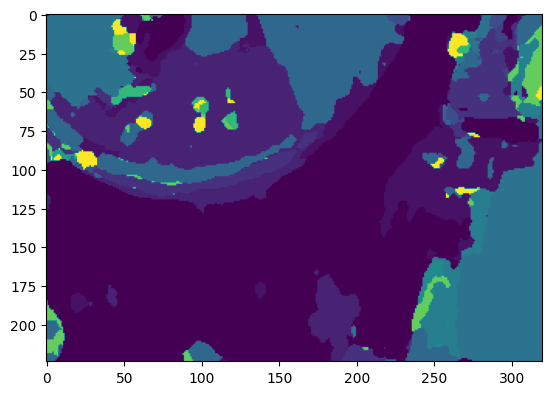

In [ ]:
plt.imshow(r.squeeze().cpu().argmax(dim=0))

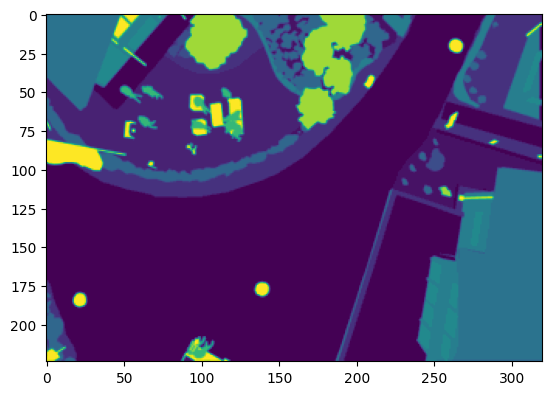

In [ ]:
plt.imshow(ma.squeeze().to(torch.uint8))

In [ ]:
im, ma = train_dataset[50]

r = model(im.unsqueeze(0).to(device))

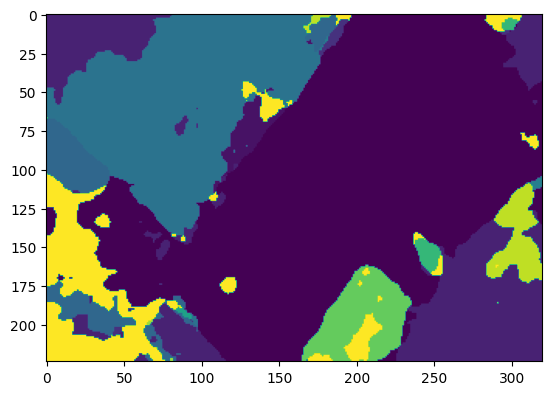

In [ ]:
plt.imshow(r.squeeze().cpu().argmax(dim=0))

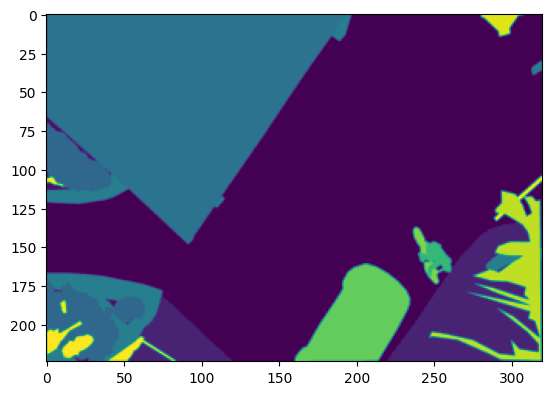

In [ ]:
plt.imshow(ma.squeeze().to(torch.uint8))

In [ ]:
torch.save(model.state_dict(), 'fpn_mobilenet.pt')

<p style="font-size: 18px">Попробуем также обучить модель архитектуры FPN, но с указанием игнорирования индекса 0 (неразмечено) при оптимизации</p>

In [ ]:
fpn = smp.FPN(
    encoder_name="timm-mobilenetv3_large_minimal_100",
    encoder_weights="imagenet",
    in_channels=3,
    classes=len(classes),
)

fpn

In [ ]:
for p in fpn.parameters():
    p.requires_grad = False

for p in fpn.segmentation_head.parameters():
    p.requires_grad = True

for p in fpn.decoder.parameters():
    p.requires_grad = True

In [ ]:
torch.cuda.empty_cache()

In [ ]:
%%capture

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
fpn.to(device)

In [ ]:
parameters = [p for p in fpn.parameters() if p.requires_grad]

optimizer = torch.optim.Adam(parameters, lr=0.0001)
criterion = nn.CrossEntropyLoss(ignore_index=0)

In [ ]:
from tqdm import tqdm
from math import ceil

bs = train_data_loader.batch_size

total_b = ceil(len(train_dataset) / bs)
# total_val_b = ceil(len(val_ds) / bs)

n_epoch = 15

# best_loss = float('inf')

loss_history = []
accuracy_history = []
f1_history = []

fpn.train()

for epoch in range(1, n_epoch+1):
    total_loss = 0
    with tqdm(train_data_loader, total=total_b) as loader:
        loader.set_description_str(f'Epoch {epoch} of {n_epoch}')
        step = 0
        for x, y in loader:
            optimizer.zero_grad()
            x = x.to(device)
            y = y.to(device)
            output = fpn(x)

            loss = criterion(output, y)

            loss.backward()
            optimizer.step()

            x = x.to('cpu')
            y = y.to('cpu')

            del x
            del y

            total_loss += loss.item()
            step += 1
            loader.set_postfix_str('Loss: {:.5f}, Loss per batch: {:.5f}'.format(total_loss, total_loss/step))
        loss_history.append(total_loss/total_b)

Epoch 15 of 15: 100%|██████████| 80/80 [04:30<00:00,  3.38s/it, Loss: 58.69712, Loss per batch: 0.73371]


In [ ]:
im, ma = train_dataset[50]

r = fpn(im.unsqueeze(0).to(device))

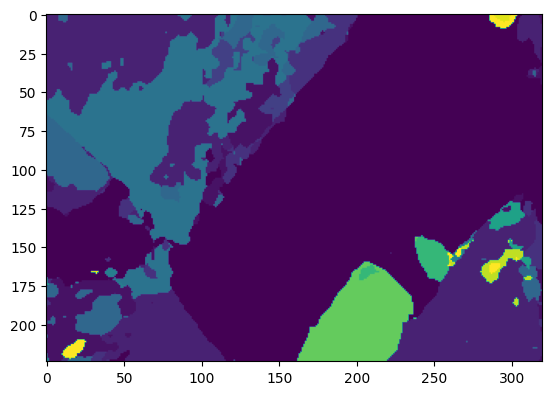

In [ ]:
plt.imshow(r.squeeze().cpu().argmax(dim=0))

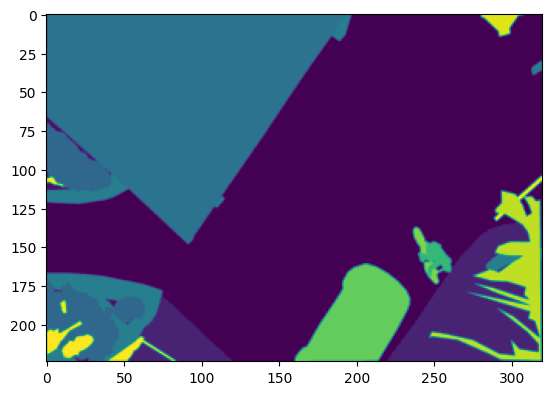

In [ ]:
plt.imshow(ma.squeeze().to(torch.uint8))

In [ ]:
im, ma = train_dataset[26]

r = fpn(im.unsqueeze(0).to(device))

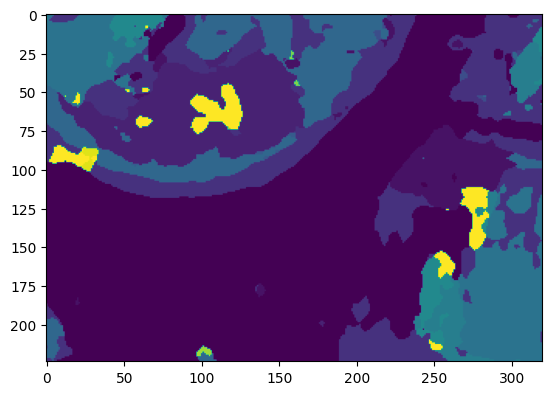

In [ ]:
plt.imshow(r.squeeze().cpu().argmax(dim=0))

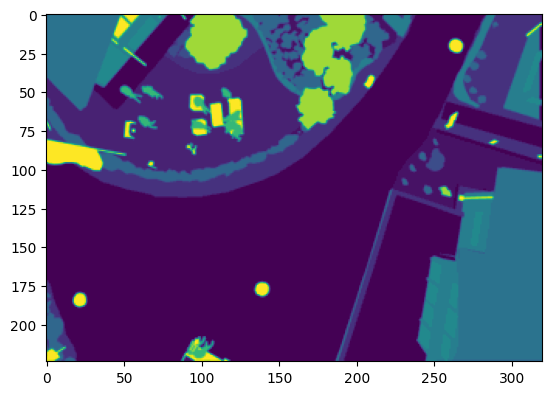

In [ ]:
plt.imshow(ma.squeeze().to(torch.uint8))